## Loading Libraries

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import time
import shutil
import cv2
from tqdm import tqdm
from imgaug import augmenters as iaa
try:
    import segmentation_models as sm
except:
    !pip install segmentation_models
    import segmentation_models as sm
import datetime
import re
!pip install patchify
from patchify import patchify, unpatchify

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Get Data

In [ ]:
# ! gdown 1qUVovfl3kY2r3I_pUXzaova1UCkAV-Mb
# ! unzip 'preprocessed_data_256_400_v1.zip' -d ''
! unzip '/content/drive/MyDrive/AppliedAI/self_case_study_2/ProcessedData/preprocessed_data_256_400_v1.zip' -d ''
os.chdir('Steel_Defect_Detection')

## Prepare Data

In [ ]:
c_X_train, c_X_val = pickle.load(open('cropped_metadata.pkl', 'rb'))

In [ ]:
#Add ClassId column
# ClassId ---> 1_0_0_0 implies only Defect type 1 is present
# ClassId ---> 1_0_1_0 implies only Defect type 1 and 3 are present
c_X_train['ClassId'] = c_X_train.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                           str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)
c_X_val['ClassId'] = c_X_val.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                       str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)

In [ ]:
# distribution of different defect types
c_X_train[['Stratify']].value_counts(normalize=True), c_X_val[['Stratify']].value_counts(normalize=True)

(Stratify
 0           0.738164
 3           0.198205
 4           0.031505
 1           0.027029
 2           0.005097
 dtype: float64, Stratify
 0           0.731404
 3           0.202367
 4           0.033313
 1           0.027844
 2           0.005072
 dtype: float64)

In [ ]:
# distribution of defective and normal sample
c_X_train[['isDefective']].value_counts(normalize=True), c_X_val[['isDefective']].value_counts(normalize=True)

(isDefective
 0              0.738164
 1              0.261836
 dtype: float64, isDefective
 0              0.731404
 1              0.268596
 dtype: float64)

In [ ]:
#from now onwards we will work with 20% of data for experimentation
#once experimentation is done we will pick the best model and train it on full data
#now we can perform train test split
from sklearn.model_selection import train_test_split
_, c_X_train = train_test_split(c_X_train, test_size=0.2, stratify=c_X_train['isDefective'], random_state=0)
_, c_X_val = train_test_split(c_X_val, test_size=0.2, stratify=c_X_val['isDefective'], random_state=0)

## DataPipeLine

In [ ]:
def read_image(image, flag='IMREAD_UNCHANGED'):
    #return numpy array given image path
    if flag == 'IMREAD_UNCHANGED':
        return cv2.imread(image, cv2.IMREAD_UNCHANGED)
    elif flag == 'IMREAD_GRAYSCALE':
        return cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    else:
        raise Exception("Please provide valid flag")

In [ ]:
#different augmentation techniques
aug1 = iaa.Resize({"height": 256, "width": 400}, cv2.INTER_AREA) #resize image
aug2 = iaa.Fliplr(1) #flip horizontal
aug3 = iaa.Flipud(1) #flip vertical
aug4 = iaa.Emboss(alpha=(1), strength=1)
aug5 = iaa.DirectedEdgeDetect(alpha=(0.8), direction=(1.0)) #highlight image in particular direction
aug6 = iaa.Sharpen(alpha=(1.0), lightness=(1.5))

def normalize(input_image):
    #normalize given image
    input_image = input_image / 255.0
    return input_image

def _random_crop_gen_coor_(image):
    #this function generate coordinates of rectangular patch with some randomness for augmentation
    height, width = image.shape[0], image.shape[1]
    max_width = 128
    min_width = 10
    min_height = 10
    x1 = np.random.randint(0,width-max_width,1)[0]
    x2 = x1 + np.random.randint(min_width,max_width,1)[0]
    y1 = np.random.randint(0,height//2,1)[0]
    y2 = y1 + np.random.randint(min_height,height-y1,1)[0]
    return height, width, x1, x2, y1, y2

def random_crop(image, mask=None):
    #given image and mask this function will return image and mask after cropping some area randomly
    height, width, x1, x2, y1, y2 = _random_crop_gen_coor_(image)
    black_patch = np.ones((height, width))
    black_patch[y1:y2, x1:x2] = 0
    if mask is not None:
        mask = mask * black_patch
    image = image * black_patch[:, :, np.newaxis]
    return image, mask

#create a temporary dataframe with freq column which is proportional to inverse of occurrence
#for a defect which occur more freqently will be assigned lower frequency
#while defect with less occurence will be assigned higher frequency
df = c_X_train[c_X_train['isDefective']==1].copy()
df['freq'] = 1./df.groupby('Stratify')['Stratify'].transform('count')

df_v1 = c_X_train[c_X_train['isDefective']==1].copy()
df_v1['freq'] = 1./df.groupby('Stratify')['Stratify'].transform('count')

def add_defect_with_mask(image, mask, stratify='individual'):
    #given image different defect types are added
    #selection of defect type is uniform with same frequency
    global df, df_v1
    if stratify=='individual':
        sampledf = df.sample(weights = df.freq)
    elif stratify=='combined':
        sampledf = df_v1.sample(weights = df_v1.freq)

    sample_mask = read_image(sampledf['MaskPath'].values[0])
    sample_image = read_image(sampledf['ImagePath'].values[0])

    x_coor, y_coor = np.where(sample_mask!=0)
    for x, y in zip(x_coor, y_coor):
        image[x, y, :] = sample_image[x, y, :]
        mask[x, y] = sample_mask[x, y]
    return image, mask

def add_defect_without_mask(image, stratify='individual'):
    global df
    if stratify=='individual':
        sampledf = df.sample(weights = df.freq)
    elif stratify=='combined':
        sampledf = df_v1.sample(weights = df_v1.freq)

    sample_mask = read_image(sampledf['MaskPath'].values[0])
    sample_image = read_image(sampledf['ImagePath'].values[0])

    x_coor, y_coor = np.where(sample_mask!=0)
    mask = np.zeros((256,400), dtype=np.uint8)
    for x, y in zip(x_coor, y_coor):
        image[x, y, :] = sample_image[x, y, :]
        mask[x, y] = 1
    return image, mask

In [ ]:
def random_num_generator():
    return np.random.uniform()

In [ ]:
def augmentation_pipeline_1():
    #include horizontal flip and vertical flip
    def aug_with_mask(image, mask):
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
            mask = aug2.augment_image(mask)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
            mask = aug3.augment_image(mask)
        return image, mask

    def aug_without_mask(image, mask=None):
        assert mask is None
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
        mask = np.zeros((256,400), dtype=np.uint8)
        return image, mask
    return aug_with_mask, aug_without_mask

def augmentation_pipeline_2():
    #include horizontal flip, vertical flip and random crop
    def aug_with_mask(image, mask):
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
            mask = aug2.augment_image(mask)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
            mask = aug3.augment_image(mask)
        if random_num_generator()<0.5:
            image, mask = random_crop(image, mask)
        return image, mask

    def aug_without_mask(image, mask=None):
        assert mask is None
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
        if random_num_generator()<0.5:
            image, _ = random_crop(image)
        mask = np.zeros((256,400), dtype=np.uint8)
        return image, mask
    return aug_with_mask, aug_without_mask


def augmentation_pipeline_3():
    #include horizontal flip, vertical flip, random crop and random defect addition
    def aug_with_mask(image, mask):
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
            mask = aug2.augment_image(mask)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
            mask = aug3.augment_image(mask)
        if random_num_generator()<0.5:
            image, mask = add_defect_with_mask(image, mask, stratify='individual')
        if random_num_generator()<0.5:
            image, mask = random_crop(image, mask)
        return image, mask

    def aug_without_mask(image, mask=None):
        assert mask is None
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
        if random_num_generator()<0.5:
            image, mask = add_defect_without_mask(image, stratify='individual')
        if random_num_generator()<0.5:
            image, _ = random_crop(image)
        if mask is None:
            mask = np.zeros((256,400), dtype=np.uint8)
        return image, mask
    return aug_with_mask, aug_without_mask

def augmentation_pipeline_4():
    #include horizontal flip, vertical flip, random crop and random defect addition with optimised defect selection
    def aug_with_mask(image, mask):
        if random_num_generator()<0.5:
            image, mask = add_defect_with_mask(image, mask, stratify='combined')
        if random_num_generator()<0.5:
            image, mask = random_crop(image, mask)
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
            mask = aug2.augment_image(mask)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
            mask = aug3.augment_image(mask)
        return image, mask

    def aug_without_mask(image, mask=None):
        assert mask is None
        if random_num_generator()<0.5:
            image, mask = add_defect_without_mask(image, stratify='combined')
        if random_num_generator()<0.5:
            image, _ = random_crop(image)
        if random_num_generator()<0.5:
            image = aug2.augment_image(image)
        if random_num_generator()<0.5:
            image = aug3.augment_image(image)
        if mask is None:
            mask = np.zeros((256,400), dtype=np.uint8)
        return image, mask
    return aug_with_mask, aug_without_mask

In [ ]:
def load_image(input_image_path, input_mask_path, augment=True, augment_pipeline=1, normalize=False):
    def numpy_function(input_image_path, input_mask_path):
        input_image_path = input_image_path.decode()
        input_mask_path = input_mask_path.decode()

        input_image = read_image(input_image_path)

        if normalize:
            input_image = normalize(input_image)
        
        if augment:
            if augment_pipeline==1:
                aug_with_mask, aug_without_mask = augmentation_pipeline_1()
            elif augment_pipeline==2:
                aug_with_mask, aug_without_mask = augmentation_pipeline_2()
            elif augment_pipeline==3:
                aug_with_mask, aug_without_mask = augmentation_pipeline_3()
            elif augment_pipeline==4:
                aug_with_mask, aug_without_mask = augmentation_pipeline_4()
            else:
                raise Exception(f'Augmentation pipeline can be with 1,2,3,4 but {augment_pipeline} was provided as pipeline')

        if input_mask_path == '':
            if augment:
                input_image, input_mask = aug_without_mask(input_image)
                input_mask = np.stack([input_mask==i for i in range(5)], axis=-1)

                input_image = tf.cast(input_image, tf.float32)
                input_mask = tf.cast(input_mask, tf.float32)
            else:
                input_image = tf.cast(input_image, tf.float32)
                input_mask = tf.zeros((256,400,5), tf.float32)
        else:
            input_mask = read_image(input_mask_path)
            if augment:
                input_image, input_mask = aug_with_mask(input_image, input_mask)

            input_mask = np.stack([input_mask==i for i in range(5)], axis=-1)
            input_image = tf.cast(input_image, tf.float32)
            input_mask = tf.cast(input_mask, tf.float32)

        return input_image, input_mask

    input_image, input_mask = tf.numpy_function(numpy_function, [input_image_path, input_mask_path], [tf.float32, tf.float32])
    input_image.set_shape([256,400,3])
    input_mask.set_shape([256,400,5])
    return input_image, input_mask

def load_image_inference(input_image_path, normalize=False):
    def numpy_function(input_image_path):
        input_image_path = input_image_path.decode()
        input_image = read_image(input_image_path)
        if normalize:
            input_image = normalize(input_image)

        input_image = tf.cast(input_image, tf.float32)
        return input_image

    input_image = tf.numpy_function(numpy_function, [input_image_path], tf.float32)
    input_image.set_shape([256,400,3])
    return input_image

In [ ]:
def get_tf_data(train_image_data, shuffle=True, name='train_tf_data'):
    if shuffle:
        train_image_data = train_image_data.sample(frac=1)
    train_image_path = tf.data.Dataset.from_tensor_slices(train_image_data['ImagePath'].values)
    train_mask_path = tf.data.Dataset.from_tensor_slices(train_image_data['MaskPath'].values)
    train_tf_data = tf.data.Dataset.zip((train_image_path, train_mask_path), name=name)
    return train_tf_data

In [ ]:
def prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                    augment=True, augment_pipeline=1,normalize=False,
                    BATCH_SIZE=8, drop_remainder=True, repeat=True):
    train_tf_data = get_tf_data(train_image_data, shuffle, name)

    STEPS_PER_EPOCH = len(train_tf_data) // BATCH_SIZE
    train_tf_data = train_tf_data.map(lambda x,y: load_image(x, y,
                                                            augment,
                                                            augment_pipeline,
                                                            normalize),
                                      num_parallel_calls=tf.data.AUTOTUNE)
    
    batch_data = train_tf_data.batch(BATCH_SIZE, drop_remainder=drop_remainder, name=name)
    if repeat:
        batch_data = batch_data.repeat()
    batch_data = batch_data.prefetch(buffer_size=tf.data.AUTOTUNE)

    return batch_data, STEPS_PER_EPOCH

In [ ]:
def prepare_batches_inference(train_image_data, name='train_tf_data',
                              normalize=False,
                              BATCH_SIZE=8):
    
    train_tf_data = tf.data.Dataset.from_tensor_slices(train_image_data['ImagePath'].values)

    STEPS_PER_EPOCH = len(train_tf_data) // BATCH_SIZE
    train_tf_data = train_tf_data.map(lambda x: load_image_inference(x),
                                      num_parallel_calls=tf.data.AUTOTUNE)
    
    batch_data = train_tf_data.batch(BATCH_SIZE, drop_remainder=False, name=name)
    batch_data = batch_data.prefetch(buffer_size=tf.data.AUTOTUNE)

    return batch_data, STEPS_PER_EPOCH

In [ ]:
def display(display_list):
    image_batch = display_list[0]
    mask_batch = display_list[1]
    fig, axs = plt.subplots(image_batch.shape[0], 2, figsize=(11,30))
    for i in range(image_batch.shape[0]):
        axs[i][0].imshow(tf.keras.utils.array_to_img(image_batch[i]))
        axs[i][1].imshow(np.argmax(mask_batch[i].numpy(), axis=-1), vmin=0, vmax=4)
        axs[i][0].axis('off')
        axs[i][1].axis('off')
    plt.show()

## Common Functions

In [ ]:
! gdown 1WpCi1qQpL4nQF2P34pPBSdHLaeHyJGV_
from unet_from_segmentation_model_v3 import Unet, Unet_plus_plus

Downloading...
From: https://drive.google.com/uc?id=1WpCi1qQpL4nQF2P34pPBSdHLaeHyJGV_
To: /content/Steel_Defect_Detection/unet_from_segmentation_model_v3.py
100% 17.2k/17.2k [00:00<00:00, 29.0MB/s]


In [ ]:
class CustomCheckPoint(tf.keras.callbacks.Callback):
    def __init__(self, path, freq=1):
        super(CustomCheckPoint, self).__init__()
        self.path = path
        self.freq = freq
        if not os.path.exists(self.path):
            os.makedirs(self.path)
    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1) % self.freq == 0:
            self.model.save_weights(os.path.join(self.path, f'model-{epoch+1:02}.h5'))

def schedule(epoch, lr):
    if epoch==5:
        lr = lr *0.1
    elif epoch==25:
        lr = lr * 0.5
    elif epoch==35:
        lr = lr * 0.5
    else:
        return lr
    return lr

In [ ]:
def create_and_compile(loss, optimizer, metrics, 
                       backbone='resnet34',
                       path='SegmentationModel/UnetPretrainedResNet50_half_data', freq=2):
    unet_model = Unet(
                        backbone_name=backbone,
                        input_shape=(256, 400, 3),
                        classes=5,
                        activation='softmax',
                        weights=None,
                        encoder_weights='imagenet',
                        encoder_freeze=False,
                        encoder_features='default',
                        decoder_block_type='upsampling',
                        decoder_filters=(256, 128, 64, 32, 16),
                        decoder_use_batchnorm=True,
                )

    callbacks = [
        CustomCheckPoint(path, freq),
        tf.keras.callbacks.LearningRateScheduler(schedule),
        tf.keras.callbacks.TensorBoard(log_dir=os.path.join(path, 'logs', 
                                                            datetime.datetime.now().strftime("%m-%d-%Y_%H-%M-%S")))
    ]

    unet_model.compile(loss=loss, optimizer=optimizer, metrics=metrics)

    return unet_model, callbacks

In [ ]:
def create_and_compile_plus(loss, optimizer, metrics, 
                            path='SegmentationModel/UnetPretrainedResNet50_half_data', freq=2):
    model = Unet_plus_plus(input_shape=(256,400,3),
                           activation='softmax',
                           classes=5, mode='accurate')

    callbacks = [
        CustomCheckPoint(path, freq),
        tf.keras.callbacks.LearningRateScheduler(schedule),
        tf.keras.callbacks.TensorBoard(log_dir=os.path.join(path, 'logs', 
                                       datetime.datetime.now().strftime("%m-%d-%Y_%H-%M-%S")))
    ]

    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)

    return model, callbacks

# Unet with Pretrained ResNet34 as backbone

About Experiment:
- 20% data is used
- We will use Unet with Pretrained ResNet34 as backbone as base model
- Based on different input data we will train 4 models:
    - Data without augmentation
    - With augmentation pipeline 1
    - with augmentation pipeline 2
    - with augmentation pipeline 3

## Without Augmentation


In [ ]:
train_image_data = c_X_train[(c_X_train['DiscardFromTraining']==0)&(c_X_train['isDefective']==1)]
val_image_data = c_X_val[(c_X_val['DiscardFromTraining']==0)&(c_X_val['isDefective']==1)]

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                augment=False, augment_pipeline=1,normalize=False,
                                BATCH_SIZE=8, drop_remainder=True, repeat=True)

val_batches, VALIDATION_STEPS = prepare_batches(val_image_data, shuffle=True, name='val_tf_data',
                              augment=False, augment_pipeline=1,normalize=False,
                              BATCH_SIZE=8, drop_remainder=True, repeat=True)

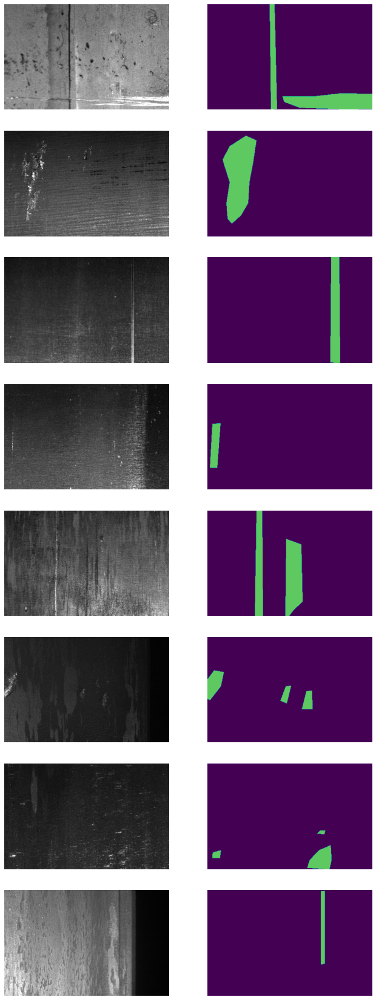

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
root_path = root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet34_without_augmentation')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet34', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

85532672/85521592 [==============================] - 3s 0us/step
Epoch 1/10
263/263 [==============================] - 81s 290ms/step - loss: 0.7927 - iou_score: 0.2371 - val_loss: 3.3181 - val_iou_score: 0.0551 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 76s 287ms/step - loss: 0.7336 - iou_score: 0.2765 - val_loss: 0.8224 - val_iou_score: 0.2354 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 72s 274ms/step - loss: 0.7174 - iou_score: 0.2887 - val_loss: 0.7554 - val_iou_score: 0.2745 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 76s 290ms/step - loss: 0.7053 - iou_score: 0.2981 - val_loss: 0.7497 - val_iou_score: 0.2760 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 76s 288ms/step - loss: 0.6945 - iou_score: 0.3059 - val_loss: 0.7029 - val_iou_score: 0.3002 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 75s 285ms/step - loss: 0.6662 - iou_score: 0.3260 - val_loss: 0.6615 - val_iou_sc

## Augmentation Pipeline 1

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=1,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

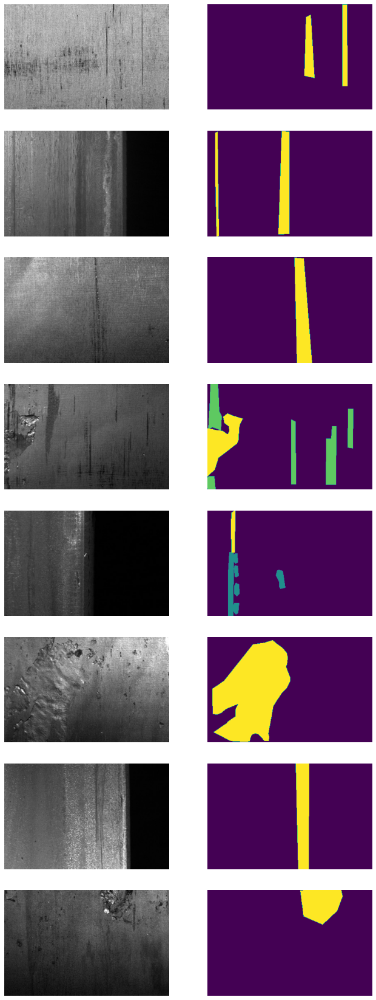

In [ ]:
#augmentation pipeline 1 include horizontal and vertical flip
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet34_with_aug_1')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet34', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 89s 324ms/step - loss: 0.7909 - iou_score: 0.2392 - val_loss: 1.7201 - val_iou_score: 0.1125 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 83s 316ms/step - loss: 0.7350 - iou_score: 0.2758 - val_loss: 0.9386 - val_iou_score: 0.2405 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 81s 306ms/step - loss: 0.7211 - iou_score: 0.2862 - val_loss: 1.0727 - val_iou_score: 0.1968 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 84s 318ms/step - loss: 0.7059 - iou_score: 0.2971 - val_loss: 0.8113 - val_iou_score: 0.2897 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 83s 315ms/step - loss: 0.6987 - iou_score: 0.3024 - val_loss: 0.7825 - val_iou_score: 0.2683 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 83s 315ms/step - loss: 0.6724 - iou_score: 0.3195 - val_loss: 0.6588 - val_iou_score: 0.3326 - lr: 1.0000e-04
Epoch 7/10
263/263 [================

## Augmentation Pipeline 2

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=2,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

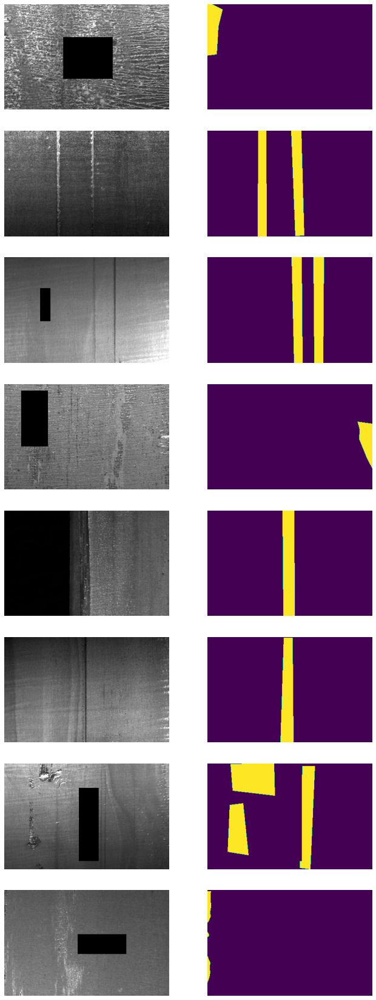

In [ ]:
#augmentation pipeline 2 include horizontal flip, vertical flip and random crop
#we can visualize black in below images which are result of random crop
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet34_with_aug_2')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet34', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 89s 323ms/step - loss: 0.7713 - iou_score: 0.2495 - val_loss: 0.9454 - val_iou_score: 0.2539 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 85s 323ms/step - loss: 0.7267 - iou_score: 0.2808 - val_loss: 1.1904 - val_iou_score: 0.1871 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 82s 313ms/step - loss: 0.7214 - iou_score: 0.2836 - val_loss: 0.7071 - val_iou_score: 0.2967 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 83s 316ms/step - loss: 0.7096 - iou_score: 0.2922 - val_loss: 0.7137 - val_iou_score: 0.2941 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 83s 316ms/step - loss: 0.6935 - iou_score: 0.3051 - val_loss: 0.9067 - val_iou_score: 0.2401 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 84s 321ms/step - loss: 0.6671 - iou_score: 0.3235 - val_loss: 0.6465 - val_iou_score: 0.3414 - lr: 1.0000e-04
Epoch 7/10
263/263 [================

## Augmentation Pipeline 3

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=3,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

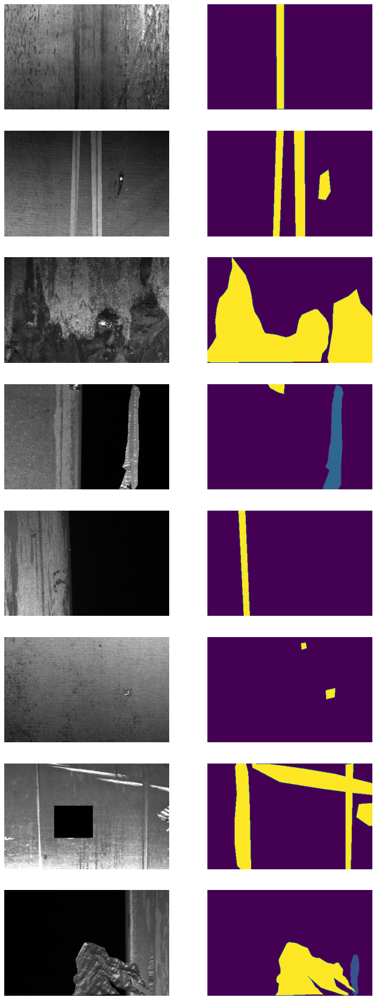

In [ ]:
#augmentation pipeline 3 include adding defect randomly
#in image 4 we can observe addition of defect
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet34_with_aug_3')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet34', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 116s 425ms/step - loss: 0.7441 - iou_score: 0.2752 - val_loss: 0.7487 - val_iou_score: 0.2801 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 107s 407ms/step - loss: 0.6750 - iou_score: 0.3240 - val_loss: 0.7097 - val_iou_score: 0.2958 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 109s 416ms/step - loss: 0.6429 - iou_score: 0.3494 - val_loss: 0.7101 - val_iou_score: 0.2991 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 109s 415ms/step - loss: 0.6102 - iou_score: 0.3740 - val_loss: 0.6970 - val_iou_score: 0.2991 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 107s 409ms/step - loss: 0.5907 - iou_score: 0.3897 - val_loss: 0.7394 - val_iou_score: 0.2998 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 111s 423ms/step - loss: 0.5256 - iou_score: 0.4379 - val_loss: 0.6539 - val_iou_score: 0.3375 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

# Unet with ResNet50 as Backbone

About Experiment:
- 20% data is used
- We will use Unet with Pretrained ResNet50 as backbone as base model
- Based on different input data we will train 4 models:
    - Data without augmentation
    - With augmentation pipeline 1
    - with augmentation pipeline 2
    - with augmentation pipeline 3

## Without Augmentation

In [ ]:
train_image_data = c_X_train[(c_X_train['DiscardFromTraining']==0)&(c_X_train['isDefective']==1)]
val_image_data = c_X_val[(c_X_val['DiscardFromTraining']==0)&(c_X_val['isDefective']==1)]

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                augment=False, augment_pipeline=1,normalize=False,
                                BATCH_SIZE=8, drop_remainder=True, repeat=True)

val_batches, VALIDATION_STEPS = prepare_batches(val_image_data, shuffle=True, name='val_tf_data',
                              augment=False, augment_pipeline=1,normalize=False,
                              BATCH_SIZE=8, drop_remainder=True, repeat=True)

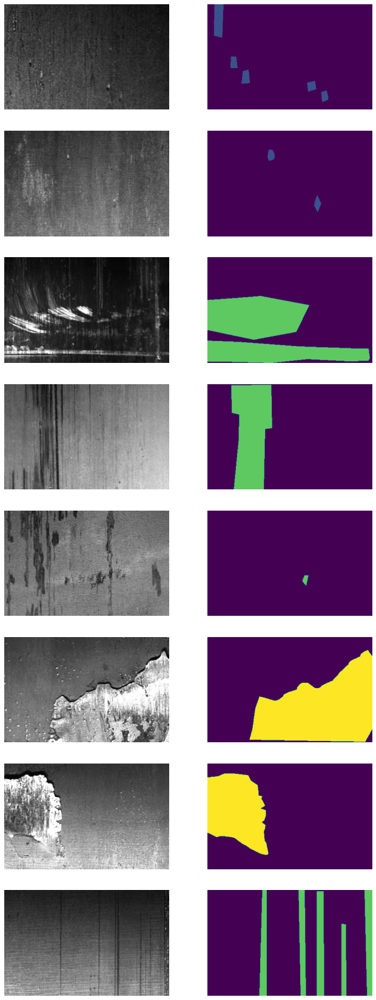

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet50_without_augmentation')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet50', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

94601216/94592056 [==============================] - 0s 0us/step
Epoch 1/10
263/263 [==============================] - 136s 426ms/step - loss: 0.7756 - iou_score: 0.2473 - val_loss: 1.1742 - val_iou_score: 0.1529 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 107s 409ms/step - loss: 0.7178 - iou_score: 0.2871 - val_loss: 0.7584 - val_iou_score: 0.2680 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 107s 407ms/step - loss: 0.7027 - iou_score: 0.2990 - val_loss: 0.7453 - val_iou_score: 0.2863 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 108s 410ms/step - loss: 0.6913 - iou_score: 0.3069 - val_loss: 0.8327 - val_iou_score: 0.2480 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 106s 405ms/step - loss: 0.6806 - iou_score: 0.3151 - val_loss: 1.4487 - val_iou_score: 0.0897 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 117s 444ms/step - loss: 0.6421 - iou_score: 0.3426 - val_loss: 0.6395 - val_

## Augmentation Pipeline 1

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=1,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

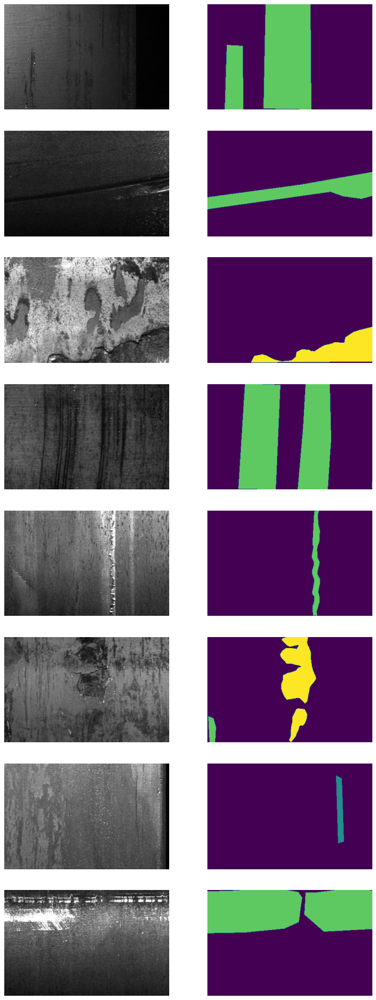

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet50_with_aug_1')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet50', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 110s 395ms/step - loss: 0.7869 - iou_score: 0.2380 - val_loss: 0.8031 - val_iou_score: 0.2335 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 103s 391ms/step - loss: 0.7345 - iou_score: 0.2747 - val_loss: 0.7618 - val_iou_score: 0.2702 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 101s 385ms/step - loss: 0.7153 - iou_score: 0.2895 - val_loss: 0.7073 - val_iou_score: 0.2981 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 107s 408ms/step - loss: 0.7076 - iou_score: 0.2951 - val_loss: 0.7142 - val_iou_score: 0.2973 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 113s 428ms/step - loss: 0.7020 - iou_score: 0.3000 - val_loss: 1.2670 - val_iou_score: 0.1920 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 105s 400ms/step - loss: 0.6849 - iou_score: 0.3109 - val_loss: 0.6565 - val_iou_score: 0.3305 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

## Augmentation Pipeline 2

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=2,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

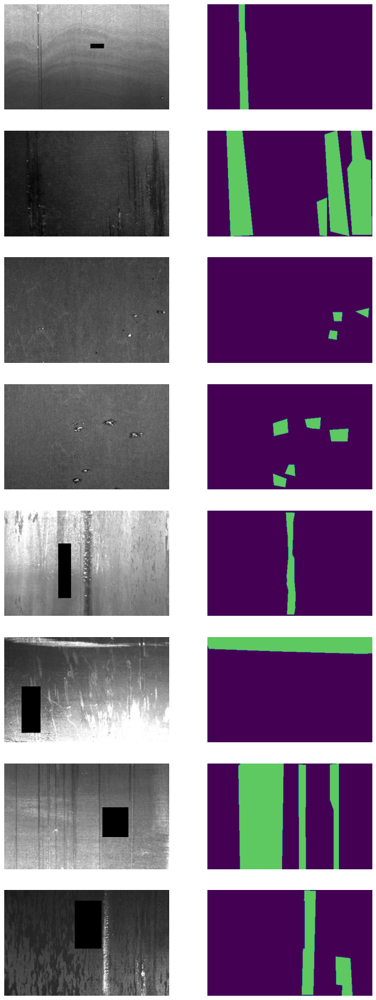

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet50_with_aug_2')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet50', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

94601216/94592056 [==============================] - 4s 0us/step
Epoch 1/10
263/263 [==============================] - 123s 381ms/step - loss: 0.7865 - iou_score: 0.2390 - val_loss: 2.0459 - val_iou_score: 0.0765 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 101s 382ms/step - loss: 0.7365 - iou_score: 0.2721 - val_loss: 1.3443 - val_iou_score: 0.1598 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 100s 381ms/step - loss: 0.7183 - iou_score: 0.2860 - val_loss: 0.8620 - val_iou_score: 0.2102 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 101s 383ms/step - loss: 0.7215 - iou_score: 0.2847 - val_loss: 1.4261 - val_iou_score: 0.0699 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 102s 386ms/step - loss: 0.7190 - iou_score: 0.2860 - val_loss: 0.7587 - val_iou_score: 0.2704 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 101s 383ms/step - loss: 0.6883 - iou_score: 0.3074 - val_loss: 0.6569 - val_

## Augmentation Pipeline 3

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=3,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

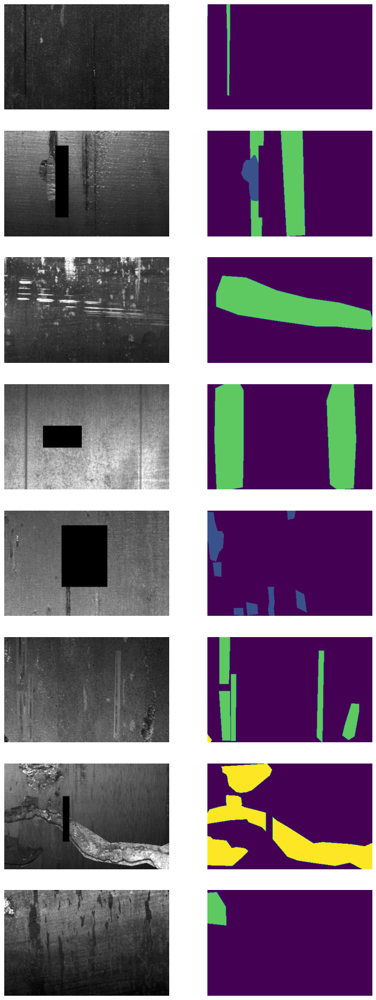

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedResNet50_with_aug_3')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='resnet50', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 170s 625ms/step - loss: 0.7570 - iou_score: 0.2644 - val_loss: 1.1312 - val_iou_score: 0.2005 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 162s 618ms/step - loss: 0.6956 - iou_score: 0.3082 - val_loss: 1.0289 - val_iou_score: 0.2176 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 155s 590ms/step - loss: 0.6636 - iou_score: 0.3314 - val_loss: 0.7813 - val_iou_score: 0.2415 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 163s 622ms/step - loss: 0.6401 - iou_score: 0.3507 - val_loss: 0.7249 - val_iou_score: 0.3029 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 160s 609ms/step - loss: 0.6065 - iou_score: 0.3747 - val_loss: 0.7471 - val_iou_score: 0.2995 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 165s 629ms/step - loss: 0.5569 - iou_score: 0.4125 - val_loss: 0.6406 - val_iou_score: 0.3440 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

# Unet++

About Experiment:
- 20% data is used
- We will use Unet ++ as base model without any backbone
- Based on different input data we will train 4 models:
    - Data without augmentation
    - With augmentation pipeline 1
    - with augmentation pipeline 2
    - with augmentation pipeline 3

## Without Augmentation

In [ ]:
train_image_data = c_X_train[(c_X_train['DiscardFromTraining']==0)&(c_X_train['isDefective']==1)]
val_image_data = c_X_val[(c_X_val['DiscardFromTraining']==0)&(c_X_val['isDefective']==1)]

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                augment=False, augment_pipeline=1,normalize=False,
                                BATCH_SIZE=8, drop_remainder=True, repeat=True)

val_batches, VALIDATION_STEPS = prepare_batches(val_image_data, shuffle=True, name='val_tf_data',
                              augment=False, augment_pipeline=1,normalize=False,
                              BATCH_SIZE=8, drop_remainder=True, repeat=True)

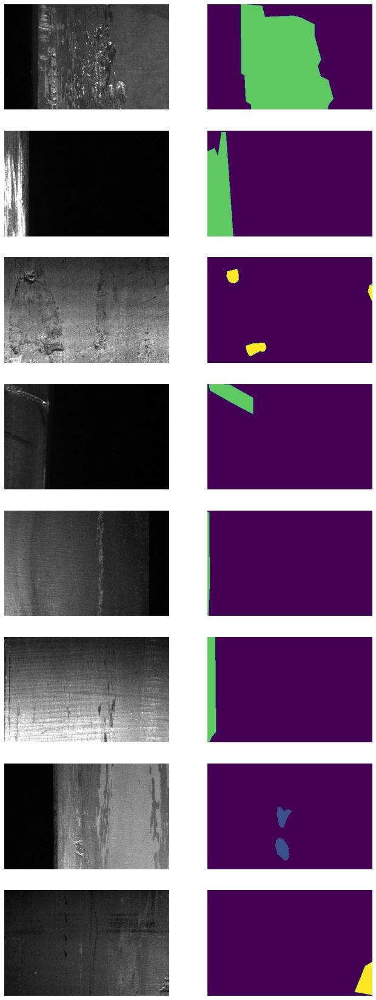

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPlus2_without_augmentation')

unet_model, callbacks = create_and_compile_plus(loss=loss, optimizer=optimizer, metrics=metrics,
                                                path=path,freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 125s 446ms/step - loss: 0.7881 - iou_score: 0.2399 - val_loss: 0.9163 - val_iou_score: 0.2117 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 115s 437ms/step - loss: 0.7427 - iou_score: 0.2681 - val_loss: 0.7870 - val_iou_score: 0.2518 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 116s 440ms/step - loss: 0.7194 - iou_score: 0.2844 - val_loss: 0.7247 - val_iou_score: 0.2975 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 115s 438ms/step - loss: 0.7007 - iou_score: 0.2976 - val_loss: 0.7050 - val_iou_score: 0.3025 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 115s 438ms/step - loss: 0.6897 - iou_score: 0.3059 - val_loss: 0.7086 - val_iou_score: 0.2994 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 126s 480ms/step - loss: 0.6589 - iou_score: 0.3259 - val_loss: 0.6615 - val_iou_score: 0.3296 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

## Augmentation Pipeline 1

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=1,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

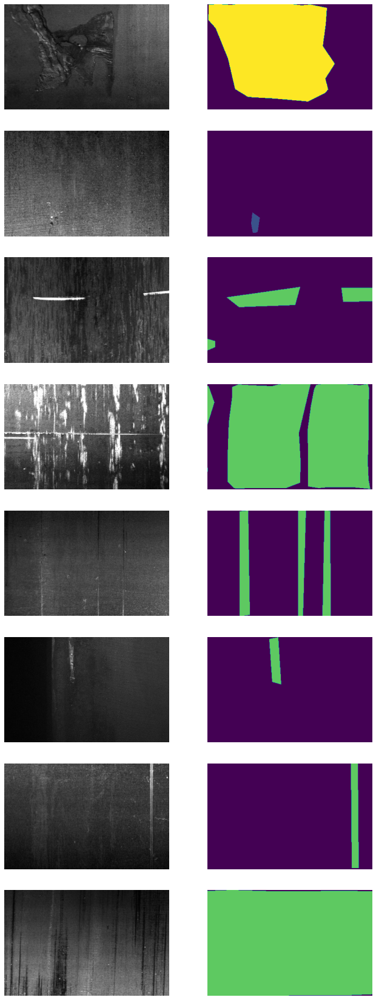

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPlus2_with_aug_1')

unet_model, callbacks = create_and_compile_plus(loss=loss, optimizer=optimizer, metrics=metrics,
                                                path=path, freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
  6/263 [..............................] - ETA: 1:41 - loss: 1.0083 - iou_score: 0.1252

263/263 [==============================] - 119s 443ms/step - loss: 0.7817 - iou_score: 0.2430 - val_loss: 1.8650 - val_iou_score: 0.0899 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 116s 441ms/step - loss: 0.7415 - iou_score: 0.2697 - val_loss: 1.2900 - val_iou_score: 0.1241 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 116s 441ms/step - loss: 0.7241 - iou_score: 0.2811 - val_loss: 0.8607 - val_iou_score: 0.2430 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 116s 442ms/step - loss: 0.7071 - iou_score: 0.2925 - val_loss: 0.8639 - val_iou_score: 0.2402 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 117s 445ms/step - loss: 0.6976 - iou_score: 0.2994 - val_loss: 0.7877 - val_iou_score: 0.2613 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 127s 483ms/step - loss: 0.6707 - iou_score: 0.3169 - val_loss: 0.6582 - val_iou_score: 0.3289 - lr: 1.0000e-04
Epoch 7/10
263/263 [=====================

## Augmentation Pipeline 2

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=2,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

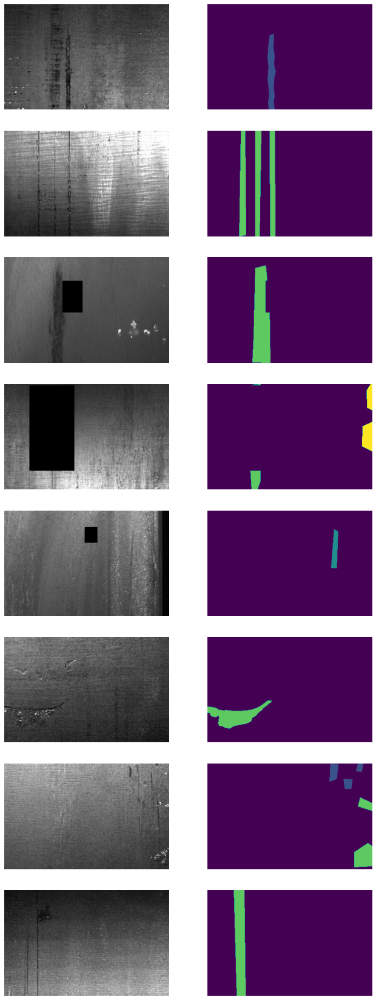

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPlus2_with_aug_2')

unet_model, callbacks = create_and_compile_plus(loss=loss, optimizer=optimizer, metrics=metrics,
                                                path=path, freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 120s 446ms/step - loss: 0.7851 - iou_score: 0.2401 - val_loss: 1.5517 - val_iou_score: 0.1285 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 116s 443ms/step - loss: 0.7513 - iou_score: 0.2618 - val_loss: 0.7508 - val_iou_score: 0.2768 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 117s 446ms/step - loss: 0.7227 - iou_score: 0.2816 - val_loss: 0.7102 - val_iou_score: 0.2987 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 118s 450ms/step - loss: 0.7034 - iou_score: 0.2959 - val_loss: 0.7197 - val_iou_score: 0.2960 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 118s 449ms/step - loss: 0.6945 - iou_score: 0.3019 - val_loss: 0.6977 - val_iou_score: 0.3091 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 128s 486ms/step - loss: 0.6670 - iou_score: 0.3215 - val_loss: 0.6588 - val_iou_score: 0.3321 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

## Augmentation Pipeline 3

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=3,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

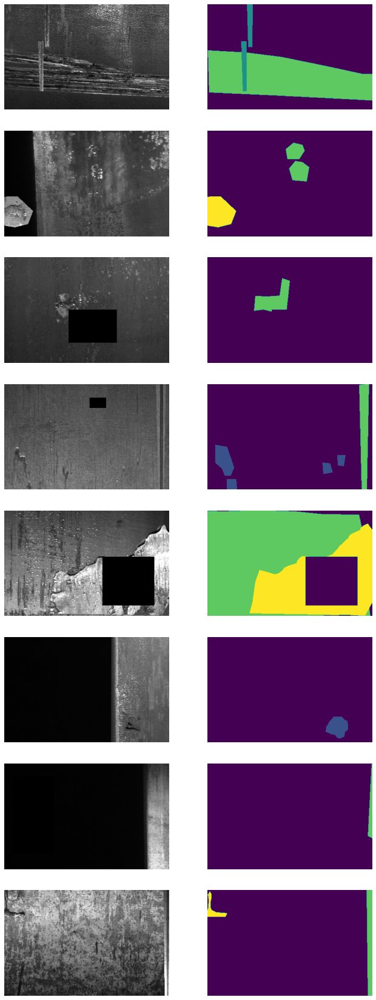

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPlus2_with_aug_3')

unet_model, callbacks = create_and_compile_plus(loss=loss, optimizer=optimizer, metrics=metrics,
                                                path=path, freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 197s 734ms/step - loss: 0.7899 - iou_score: 0.2431 - val_loss: 1.3901 - val_iou_score: 0.1402 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 187s 714ms/step - loss: 0.6962 - iou_score: 0.3061 - val_loss: 0.8633 - val_iou_score: 0.2249 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 187s 711ms/step - loss: 0.6368 - iou_score: 0.3501 - val_loss: 0.8946 - val_iou_score: 0.2319 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 190s 722ms/step - loss: 0.6061 - iou_score: 0.3738 - val_loss: 0.7714 - val_iou_score: 0.2691 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 183s 698ms/step - loss: 0.5903 - iou_score: 0.3858 - val_loss: 0.7386 - val_iou_score: 0.2863 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 189s 720ms/step - loss: 0.5469 - iou_score: 0.4188 - val_loss: 0.6580 - val_iou_score: 0.3320 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

# Unet with Pretrained EfficientNetB4

About Experiment:
- 20% data is used
- We will use Unet with Pretrained EfficientnetB4 as backbone as base model
- Based on different input data we will train 5 models:
    - Data without augmentation
    - With augmentation pipeline 1
    - with augmentation pipeline 2
    - with augmentation pipeline 3
    - with augmentation pipeline 4

## Without Augmentation

In [ ]:
train_image_data = c_X_train[(c_X_train['DiscardFromTraining']==0)&(c_X_train['isDefective']==1)]
val_image_data = c_X_val[(c_X_val['DiscardFromTraining']==0)&(c_X_val['isDefective']==1)]

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                augment=False, augment_pipeline=1,normalize=False,
                                BATCH_SIZE=8, drop_remainder=True, repeat=True)

val_batches, VALIDATION_STEPS = prepare_batches(val_image_data, shuffle=True, name='val_tf_data',
                              augment=False, augment_pipeline=1,normalize=False,
                              BATCH_SIZE=8, drop_remainder=True, repeat=True)

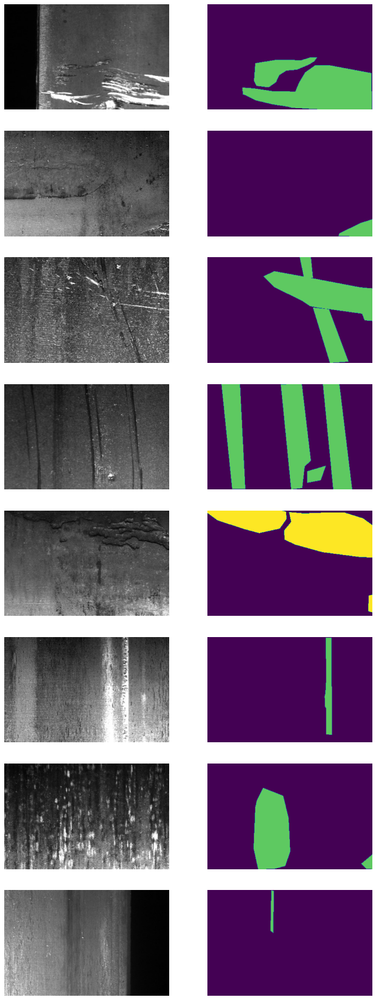

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_without_augmentation')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

71696384/71686520 [==============================] - 2s 0us/step
Epoch 1/10
263/263 [==============================] - 178s 598ms/step - loss: 0.7511 - iou_score: 0.2658 - val_loss: 2.0685 - val_iou_score: 0.1574 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 155s 590ms/step - loss: 0.6806 - iou_score: 0.3172 - val_loss: 0.7321 - val_iou_score: 0.2985 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 154s 585ms/step - loss: 0.6572 - iou_score: 0.3356 - val_loss: 0.6587 - val_iou_score: 0.3489 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 156s 595ms/step - loss: 0.6390 - iou_score: 0.3489 - val_loss: 1.0482 - val_iou_score: 0.2610 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 155s 589ms/step - loss: 0.6095 - iou_score: 0.3713 - val_loss: 0.6254 - val_iou_score: 0.3720 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 155s 590ms/step - loss: 0.5632 - iou_score: 0.4087 - val_loss: 0.5777 - val_

## Augmentation Pipeline 1

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=1,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

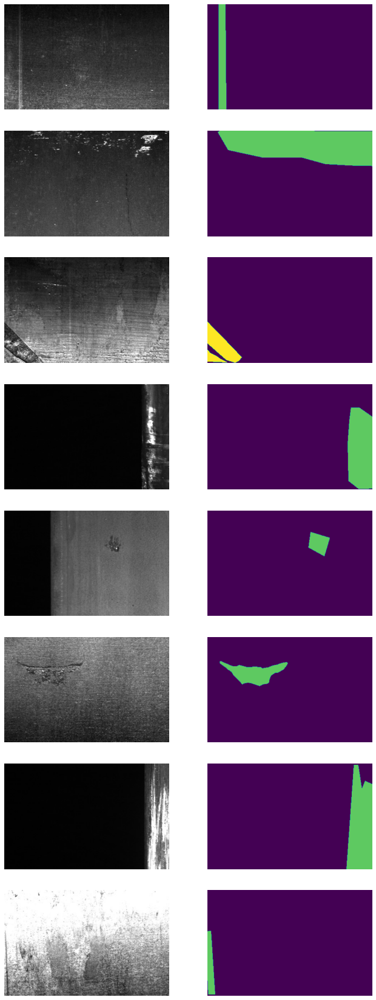

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_1')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 173s 597ms/step - loss: 0.7505 - iou_score: 0.2684 - val_loss: 0.7124 - val_iou_score: 0.3224 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 156s 594ms/step - loss: 0.6838 - iou_score: 0.3142 - val_loss: 0.6940 - val_iou_score: 0.3258 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 156s 595ms/step - loss: 0.6657 - iou_score: 0.3284 - val_loss: 0.6319 - val_iou_score: 0.3585 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 156s 592ms/step - loss: 0.6502 - iou_score: 0.3403 - val_loss: 0.6494 - val_iou_score: 0.3521 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 155s 589ms/step - loss: 0.6485 - iou_score: 0.3422 - val_loss: 0.6225 - val_iou_score: 0.3751 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 157s 596ms/step - loss: 0.6003 - iou_score: 0.3754 - val_loss: 0.5906 - val_iou_score: 0.3897 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

## Augmentation Pipeline 2

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=2,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

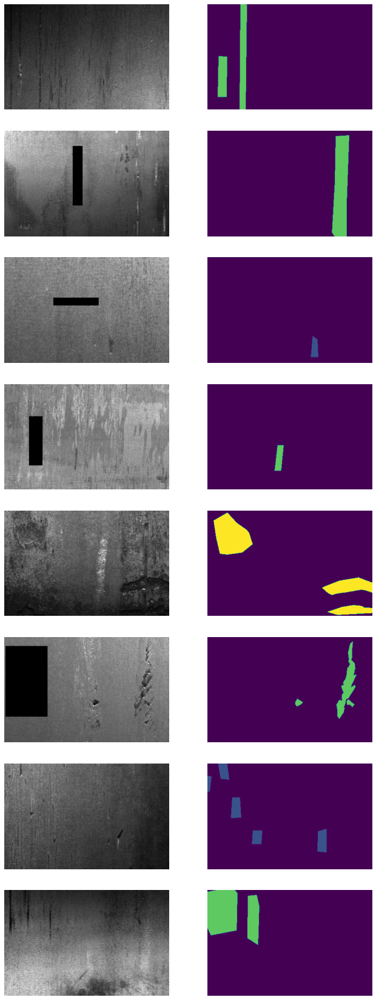

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_2')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

Epoch 1/10
263/263 [==============================] - 173s 601ms/step - loss: 0.7457 - iou_score: 0.2685 - val_loss: 0.8120 - val_iou_score: 0.2835 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 155s 591ms/step - loss: 0.6910 - iou_score: 0.3083 - val_loss: 0.6644 - val_iou_score: 0.3358 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 156s 592ms/step - loss: 0.6713 - iou_score: 0.3238 - val_loss: 0.8487 - val_iou_score: 0.2575 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 156s 592ms/step - loss: 0.6581 - iou_score: 0.3329 - val_loss: 0.7121 - val_iou_score: 0.3346 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 155s 590ms/step - loss: 0.6324 - iou_score: 0.3517 - val_loss: 0.6227 - val_iou_score: 0.3677 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 157s 596ms/step - loss: 0.5982 - iou_score: 0.3780 - val_loss: 0.5811 - val_iou_score: 0.3971 - lr: 1.0000e-04
Epoch 7/10
263/263 [==========

## Augmentation Pipeline 3

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=3,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

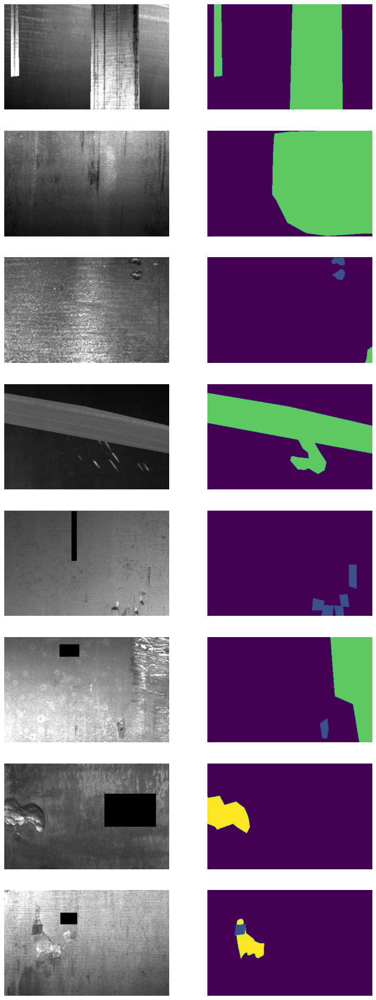

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_3')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

## Augmentation Pipeline 4

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=4,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

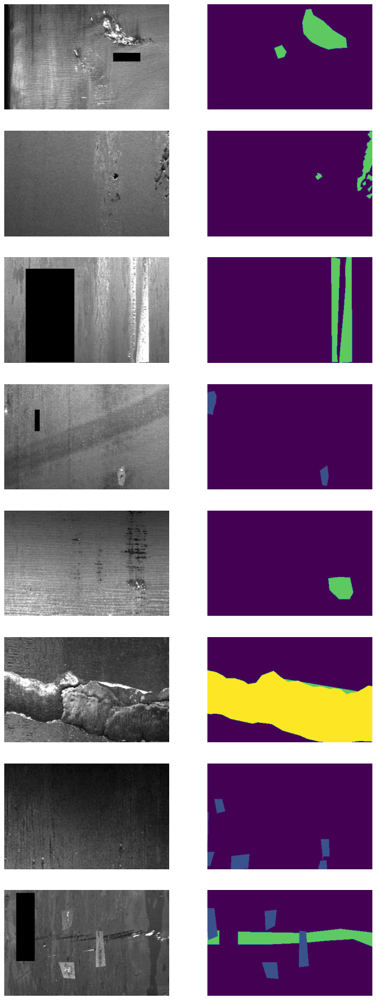

In [ ]:
for images, masks in train_batches.take(1):
    display([images, masks])

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)

history = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history.history, open(os.path.join(path, 'history.pkl'), 'wb'))

71696384/71686520 [==============================] - 1s 0us/step
Epoch 1/10
263/263 [==============================] - 228s 744ms/step - loss: 0.7282 - iou_score: 0.2887 - val_loss: 0.7220 - val_iou_score: 0.3120 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 191s 725ms/step - loss: 0.6011 - iou_score: 0.3798 - val_loss: 0.6767 - val_iou_score: 0.3316 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 186s 709ms/step - loss: 0.5344 - iou_score: 0.4331 - val_loss: 0.6164 - val_iou_score: 0.3718 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 197s 748ms/step - loss: 0.4845 - iou_score: 0.4758 - val_loss: 0.6145 - val_iou_score: 0.3711 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 194s 738ms/step - loss: 0.4506 - iou_score: 0.5061 - val_loss: 0.6160 - val_iou_score: 0.3775 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 179s 682ms/step - loss: 0.4108 - iou_score: 0.5403 - val_loss: 0.5747 - val_

# Evaluate All Models

About models:
- All models were trained on 20% of defective samples from train data and evaluated on 20% of validation defective samples
- We trained total 17 models which can be divided into 4 sub type:
    - Unet based pretrained on ResNet34 (4)
    - Unet based pretrained on ResNet50 (4)
    - Unet based pretrained on EfficientNetB4 (5)
    - Unet++ (4)
- All the above sub types are further divided into 4 categories based on augmentation techniques:
    - Without augmentation
    - With augmentation pipeline 1
    - With augmentation pipeline 2
    - With augmentation pipeline 3
- Only Unet with EfficientNetB4 was trained on augmentation pipeline 4 data also
- So for every sub type model was trained on 4 type of input data as mentioned above resulting in 4 different models
- Example, Unet model pretrained on ResNet34 was trained without augmentation, with augmentation pipeline 1, 2 and 3 resulting in 4 different models
- In this section we will evaluate results from all the 17 models

In [ ]:
def create_and_load_weights(loss, optimizer, metrics, 
                            backbone='resnet34',
                            path='SegmentationModel/UnetPretrainedResNet50_half_data'):
    unet_model = Unet(
                        backbone_name=backbone,
                        input_shape=(256, 400, 3),
                        classes=5,
                        activation='softmax',
                        weights=None,
                        encoder_weights='imagenet',
                        encoder_freeze=False,
                        encoder_features='default',
                        decoder_block_type='upsampling',
                        decoder_filters=(256, 128, 64, 32, 16),
                        decoder_use_batchnorm=True,
                )

    unet_model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    unet_model.load_weights(os.path.join(path, 'model-10.h5'))

    return unet_model

def create_and_load_weights_plus(loss, optimizer, metrics, 
                                 path='SegmentationModel/UnetPretrainedResNet50_half_data'):
    model = Unet_plus_plus(input_shape=(256,400,3),
                           activation='softmax',
                           classes=5, mode='accurate')

    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    model.load_weights(os.path.join(path, 'model-10.h5'))
    return model

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore(class_indexes=1, name='IOU_1'),sm.metrics.IOUScore(class_indexes=2, name='IOU_2'),
           sm.metrics.IOUScore(class_indexes=3, name='IOU_3'), sm.metrics.IOUScore(class_indexes=4, name='IOU_4')]
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

####### UNET MODEL PRETRAINED ON RESNET34 #######
path = os.path.join(root_path, 'UnetPretrainedResNet34_without_augmentation')
model_1_1 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet34',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedResNet34_with_aug_1')
model_1_2 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet34',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedResNet34_with_aug_2')
model_1_3 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet34',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedResNet34_with_aug_3')
model_1_4 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet34',
                                    path=path)

####### UNET MODEL PRETRAINED ON RESNET50 #######
path = os.path.join(root_path, 'UnetPretrainedResNet50_without_augmentation')
model_2_1 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet50',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedResNet50_with_aug_1')
model_2_2 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet50',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedResNet50_with_aug_2')
model_2_3 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet50',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedResNet50_with_aug_3')
model_2_4 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='resnet50',
                                    path=path)

####### UNET ++ #######
path = os.path.join(root_path, 'UnetPlus2_without_augmentation')
model_3_1 = create_and_load_weights_plus(loss, optimizer, metrics, 
                                         path=path)

path = os.path.join(root_path, 'UnetPlus2_with_aug_1')
model_3_2 = create_and_load_weights_plus(loss, optimizer, metrics, 
                                         path=path)

path = os.path.join(root_path, 'UnetPlus2_with_aug_2')
model_3_3 = create_and_load_weights_plus(loss, optimizer, metrics, 
                                         path=path)

path = os.path.join(root_path, 'UnetPlus2_with_aug_3')
model_3_4 = create_and_load_weights_plus(loss, optimizer, metrics,
                                         path=path)

####### UNET MODEL PRETRAINED ON EFFICIENTNET-B4 #######
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_without_augmentation')
model_4_1 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='efficientnetb4',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_1')
model_4_2 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='efficientnetb4',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_2')
model_4_3 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='efficientnetb4',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_3')
model_4_4 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='efficientnetb4',
                                    path=path)


In [ ]:
####### UNET MODEL PRETRAINED ON EFFICIENTNET-B4 with Augmentation Pipeline 4#######

optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore(class_indexes=1, name='IOU_1'),sm.metrics.IOUScore(class_indexes=2, name='IOU_2'),
           sm.metrics.IOUScore(class_indexes=3, name='IOU_3'), sm.metrics.IOUScore(class_indexes=4, name='IOU_4')]
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4')
model_4_5 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='efficientnetb4',
                                    path=path)

In [ ]:
train_image_data = c_X_train[(c_X_train['DiscardFromTraining']==0)&(c_X_train['isDefective']==1)]
val_image_data = c_X_val[(c_X_val['DiscardFromTraining']==0)&(c_X_val['isDefective']==1)]

In [ ]:
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=False, name='train_tf_data',
                                augment=False, augment_pipeline=1,normalize=False,
                                BATCH_SIZE=8, drop_remainder=False, repeat=False)

val_batches, VALIDATION_STEPS = prepare_batches(val_image_data, shuffle=False, name='val_tf_data',
                              augment=False, augment_pipeline=1,normalize=False,
                              BATCH_SIZE=8, drop_remainder=False, repeat=False)

In [ ]:
model_dict = {'model_1_1':model_1_1,'model_1_2':model_1_2,'model_1_3':model_1_3,'model_1_4':model_1_4,
              'model_2_1':model_2_1,'model_2_2':model_2_2,'model_2_3':model_2_3,'model_2_4':model_2_4,
              'model_3_1':model_3_1,'model_3_2':model_3_2,'model_3_3':model_3_3,'model_3_4':model_3_4,
              'model_4_1':model_4_1,'model_4_2':model_4_2,'model_4_3':model_4_3,'model_4_4':model_4_4, 'model_4_5':model_4_5}

In [ ]:
result_dict_train = dict()
result_dict_val = dict()
for model_name, model in model_dict.items():
    result_dict_train[model_name] = model.evaluate(train_batches)
    result_dict_val[model_name] = model.evaluate(val_batches)

68/68 [==============================] - 12s 177ms/step - loss: 0.5535 - IOU_1: 0.1894 - IOU_2: 0.0672 - IOU_3: 0.5031 - IOU_4: 0.4240


In [ ]:
pickle.dump([result_dict_train,result_dict_val], open(os.path.join(root_path, 'result_dict.pkl'), 'wb'))

# Sumarize Results

In [ ]:
import numpy as np
import pandas as pd
import os
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'
result_dict_train,result_dict_val = pickle.load(open(os.path.join(root_path, 'result_dict.pkl'), 'rb'))

In [ ]:
train_result_df = pd.DataFrame.from_dict(result_dict_train, orient='index')\
                              .reset_index()\
                              .rename(columns={'index':'model_name',
                                               0:'Loss',1:'IOU_1',2:'IOU_2',3:'IOU_3',4:'IOU_4'})
train_result_df.head()

,model_name,Loss,IOU_1,IOU_2,IOU_3,IOU_4
0,model_1_1,0.613621,0.093444,0.000471,0.540313,0.251587
1,model_1_2,0.631418,0.102202,0.004667,0.482528,0.232606
2,model_1_3,0.642562,0.077448,0.000171,0.469594,0.237204
3,model_1_4,0.610068,0.121969,0.018484,0.500538,0.262719
4,model_2_1,0.602399,0.165651,0.000270,0.511871,0.264496


In [ ]:
val_result_df = pd.DataFrame.from_dict(result_dict_val, orient='index')\
                              .reset_index()\
                              .rename(columns={'index':'model_name',
                                               0:'Loss',1:'IOU_1',2:'IOU_2',3:'IOU_3',4:'IOU_4'})
val_result_df.head()

,model_name,Loss,IOU_1,IOU_2,IOU_3,IOU_4
0,model_1_1,0.621243,0.089954,0.000401,0.482445,0.326237
1,model_1_2,0.615803,0.109951,0.002642,0.446110,0.359166
2,model_1_3,0.635383,0.066941,0.000198,0.440200,0.340353
3,model_1_4,0.615639,0.086030,0.014016,0.460932,0.355919
4,model_2_1,0.609309,0.139601,0.000271,0.465655,0.341755


In [ ]:
train_result_df['model_sub_type'] = train_result_df.apply(lambda x:'UnetResNet34' if x['model_name'].startswith('model_1') else
                                                                      'UnetResNet50' if x['model_name'].startswith('model_2') else
                                                                      'Unet++' if x['model_name'].startswith('model_3') else
                                                                      'UnetEffNetB4' if x['model_name'].startswith('model_4') else '', axis=1)
val_result_df['model_sub_type'] = val_result_df.apply(lambda x:'UnetResNet34' if x['model_name'].startswith('model_1') else
                                                                  'UnetResNet50' if x['model_name'].startswith('model_2') else
                                                                  'Unet++' if x['model_name'].startswith('model_3') else
                                                                  'UnetEffNetB4' if x['model_name'].startswith('model_4') else '', axis=1)

In [ ]:
train_result_df['Augmentation_Type'] = train_result_df.apply(lambda x:'without augmentation' if x['model_name'].endswith('1') else
                                                                      'Augmentation Pipeline 1' if x['model_name'].endswith('2') else
                                                                      'Augmentation Pipeline 2' if x['model_name'].endswith('3') else
                                                                      'Augmentation Pipeline 3' if x['model_name'].endswith('4') else
                                                                      'Augmentation Pipeline 4' if x['model_name'].endswith('5') else '', axis=1)
val_result_df['Augmentation_Type'] = val_result_df.apply(lambda x:'without augmentation' if x['model_name'].endswith('1') else
                                                                  'Augmentation Pipeline 1' if x['model_name'].endswith('2') else
                                                                  'Augmentation Pipeline 2' if x['model_name'].endswith('3') else
                                                                  'Augmentation Pipeline 3' if x['model_name'].endswith('4') else
                                                                  'Augmentation Pipeline 4' if x['model_name'].endswith('5') else '', axis=1)

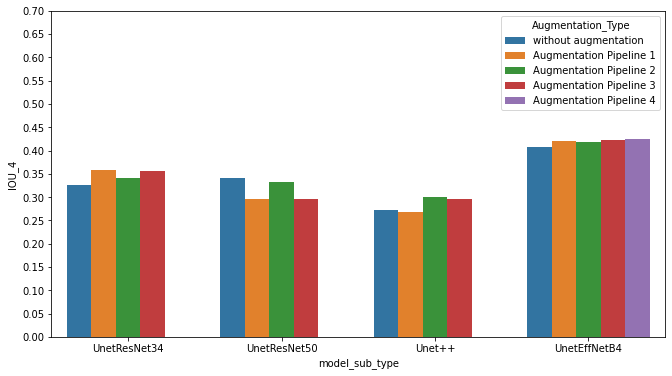

In [ ]:
# IOU of defect type 4 with different model with different augmentation texhniques used
plt.figure(figsize=(11,6))
sns.barplot(data=val_result_df, y='IOU_4', x='model_sub_type', hue='Augmentation_Type')
plt.yticks(np.arange(0,0.75,0.05))
plt.show()

About Plot:
- X axis: Differnt base model
- Y axis: Intersection of Union for defect type 4 only
- Color indicate differnt input data

Observation:
- Clearly Unet with EfficientNetB4 have outperformed all other model
- In most of the models, augmentation have improved the result
- In EfficientNetB4 augmentation pipeline 4 have slightly imrproved score from rest of the pipeline

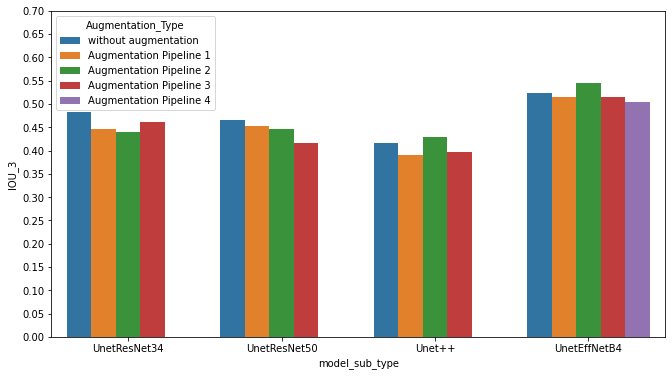

In [ ]:
# IOU distribution defect type 3 across different models with different augmentation pipeline
plt.figure(figsize=(11,6))
sns.barplot(data=val_result_df, y='IOU_3', x='model_sub_type', hue='Augmentation_Type')
plt.yticks(np.arange(0,0.75,0.05))
plt.show()

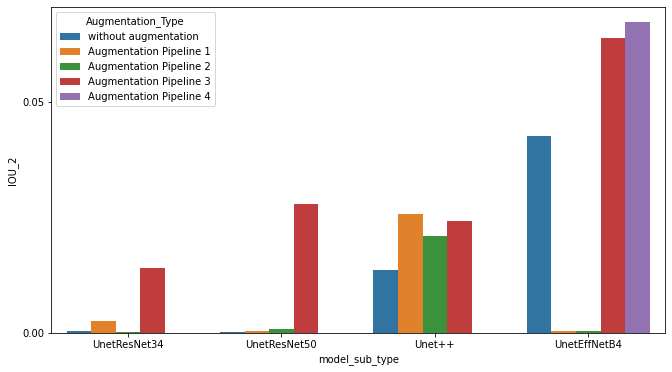

In [ ]:
# IOU distribution defect type 2 across different models with different augmentation pipeline
plt.figure(figsize=(11,6))
sns.barplot(data=val_result_df, y='IOU_2', x='model_sub_type', hue='Augmentation_Type')
plt.yticks(np.arange(0,0.1,0.05))
plt.show()

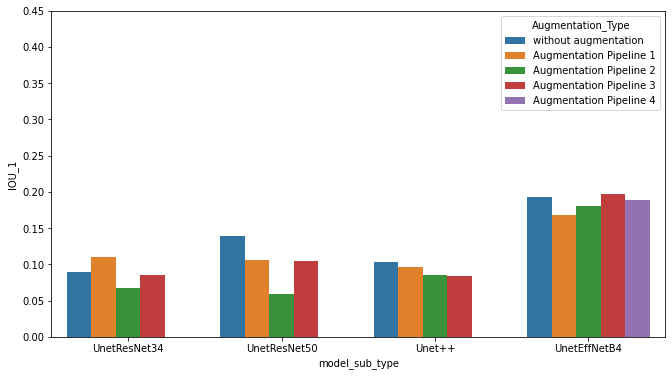

In [ ]:
# IOU distribution defect type 1 across different models with different augmentation pipeline
plt.figure(figsize=(11,6))
sns.barplot(data=val_result_df, y='IOU_1', x='model_sub_type', hue='Augmentation_Type')
plt.yticks(np.arange(0,0.5,0.05))
plt.show()

- `Unet EfficientNetB4` outperformed `UnetResNet34`, `UnetResNet50` and `Unet++`
- In the next section we will further examine `Unet EfficientNetB4`
    - where it performed great ?
    - where it failed ?

# Post Training Analysis of Unet pretrained on EfficientNetB4

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
#get model
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_3')
model_4_4 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='efficientnetb4',
                                    path=path)

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4')
model_4_5 = create_and_load_weights(loss, optimizer, metrics, 
                                    backbone='efficientnetb4',
                                    path=path)

In [ ]:
#filter data to include those with defects
train_image_data = c_X_train[(c_X_train['DiscardFromTraining']==0)&(c_X_train['isDefective']==1)]
val_image_data = c_X_val[(c_X_val['DiscardFromTraining']==0)&(c_X_val['isDefective']==1)]

In [ ]:
#create batches for prediction
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=False, name='train_tf_data',
                                augment=False, augment_pipeline=1,normalize=False,
                                BATCH_SIZE=8, drop_remainder=False, repeat=False)

val_batches, VALIDATION_STEPS = prepare_batches(val_image_data, shuffle=False, name='val_tf_data',
                              augment=False, augment_pipeline=1,normalize=False,
                              BATCH_SIZE=8, drop_remainder=False, repeat=False)

In [ ]:
def IOUScore(targets, inputs, smooth=1e-6):
    """
    Return per image Dice Loss given input and output image

    Input Parameter:
    targets: 4d array of shape (batch, height, width, channel)
    inputs: 4d array of shape (batch, height, width, channel)

    Output:
    per image per channel IOU score (Batch, channel)
    """
    inter = np.apply_over_axes(np.sum, (targets*inputs), [1,2]) # batch, 1, 1, channel
    inter = np.squeeze(inter, axis=(1,2)) # batch, channel

    y_sum = np.apply_over_axes(np.sum, inputs, [1,2]) # batch, 1, 1, channel
    y_sum = np.squeeze(y_sum, axis=(1,2)) # batch, channel

    y_hat_sum = np.apply_over_axes(np.sum, targets, [1,2]) # batch, 1, 1, channel
    y_hat_sum = np.squeeze(y_hat_sum, axis=(1,2)) # batch, channel

    union = y_sum+y_hat_sum-inter

    IOU = np.round((inter + smooth) / (union + smooth), 4).astype(np.float32)

    return IOU

In [ ]:
def inference_segmentation_IOU(dataset_obj, model, weights=[[1,1,1,1,1]]):
    """
    This function calculate IOU on train and validation data
    """

    y_IOU = []
    for batch_image, batch_mask in tqdm(dataset_obj):
        BACTH_y_hat = np.round(model.predict(batch_image), 4).astype(np.float16)
        BACTH_y_hat_mod = BACTH_y_hat * weights
        BACTH_y_hat_mod = BACTH_y_hat_mod.argmax(axis=-1)
        BACTH_y_hat_mod = np.stack([BACTH_y_hat_mod==i for i in range(5)], axis=-1)
        BACTH_y_IOU = IOUScore(BACTH_y_hat_mod, batch_mask, smooth=1e-6)
        
        y_IOU.append(BACTH_y_IOU)
    
    y_IOU = np.concatenate(y_IOU)

    return y_IOU

In [ ]:
y_IOU_train_model_4_4 = inference_segmentation_IOU(train_batches, model_4_4, weights=[[1,2,2,2,2]])
y_IOU_val_model_4_4 = inference_segmentation_IOU(val_batches, model_4_4, weights=[[1,2,2,2,2]])

y_IOU_train_model_4_5 = inference_segmentation_IOU(train_batches, model_4_5, weights=[[1,2,2,2,2]])
y_IOU_val_model_4_5 = inference_segmentation_IOU(val_batches, model_4_5, weights=[[1,2,2,2,2]])

100%|██████████| 68/68 [00:19<00:00,  3.42it/s]


In [ ]:
col_list = ['IOU_0','IOU_1','IOU_2','IOU_3','IOU_4']
tr_res_df_model_4_4 = pd.DataFrame(y_IOU_train_model_4_4, columns=col_list)
te_res_df_model_4_4 = pd.DataFrame(y_IOU_val_model_4_4, columns=col_list)

tr_res_df_model_4_5 = pd.DataFrame(y_IOU_train_model_4_5, columns=col_list)
te_res_df_model_4_5 = pd.DataFrame(y_IOU_val_model_4_5, columns=col_list)

train_image_data_model_4_4 = pd.concat([train_image_data.reset_index(drop=True), tr_res_df_model_4_4], axis=1)
val_image_data_model_4_4 = pd.concat([val_image_data.reset_index(drop=True), te_res_df_model_4_4], axis=1)

train_image_data_model_4_5 = pd.concat([train_image_data.reset_index(drop=True), tr_res_df_model_4_5], axis=1)
val_image_data_model_4_5 = pd.concat([val_image_data.reset_index(drop=True), te_res_df_model_4_5], axis=1)

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_3')
pickle.dump([train_image_data_model_4_4, val_image_data_model_4_4], open(os.path.join(path, 'result.pkl'), 'wb'))

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4')
pickle.dump([train_image_data_model_4_5, val_image_data_model_4_5], open(os.path.join(path, 'result.pkl'), 'wb'))

In [ ]:
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_3')
train_image_data_model_4_4, val_image_data_model_4_4 = pickle.load(open(os.path.join(path, 'result.pkl'), 'rb'))

path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4')
train_image_data_model_4_5, val_image_data_model_4_5 = pickle.load(open(os.path.join(path, 'result.pkl'), 'rb'))

col_list = ['IOU_0','IOU_1','IOU_2','IOU_3','IOU_4']

In [ ]:
train_image_data_model_4_4['ClassId'] = train_image_data_model_4_4.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                                     str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)
val_image_data_model_4_4['ClassId'] = val_image_data_model_4_4.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                                     str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)

train_image_data_model_4_5['ClassId'] = train_image_data_model_4_5.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                                     str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)
val_image_data_model_4_5['ClassId'] = val_image_data_model_4_5.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                                     str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)

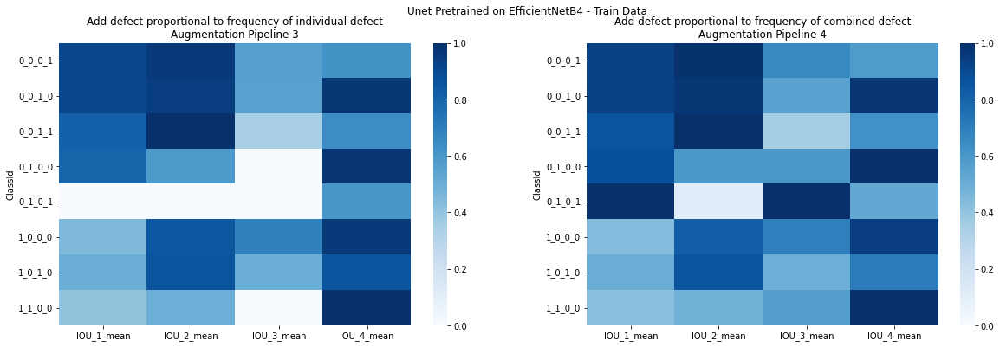

In [ ]:
temp_1 = train_image_data_model_4_4.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))

temp_2 = train_image_data_model_4_5.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))

fig, axs = plt.subplots(1,2,figsize=(20,6))
sns.heatmap(temp_1,
            vmin=0, vmax=1, cmap='Blues', ax=axs[0])

sns.heatmap(temp_2,
            vmin=0, vmax=1, cmap='Blues', ax=axs[1])

axs[0].set_yticks(np.arange(temp_1.shape[0])+0.5)
axs[0].set_yticklabels(temp_1.index.tolist(), rotation=0)
axs[1].set_yticks(np.arange(temp_2.shape[0])+0.5)
axs[1].set_yticklabels(temp_2.index.tolist(), rotation=0)
axs[0].set_title('Add defect proportional to frequency of individual defect\nAugmentation Pipeline 3')
axs[1].set_title('Add defect proportional to frequency of combined defect\nAugmentation Pipeline 4')
plt.suptitle('Unet Pretrained on EfficientNetB4 - Train Data')
plt.show()

About Plot:
- X axis: IOU score of different defect type
- Y axis: Different combination of defects
    - For example: 1_0_1_0 implied both defect 1 and 3 are present
- Each cell implies how well model performed under differnt defect type
- Dark blue is IOU score of 1 i.e model performed well in segmentation task
- White is IOU score of 0 i.e model performed worst in segmentation task
- IOU_{i} is IOU score of defect {i}

Observation:
- 1_1_0_0 (defect 1 and defect 2 are present together)
    - Model performed better with respect to IOU_3 in augmentation pipeline 4 compare to augmentation pipeline 3
- 0_1_0_0 (defect type 2)
    - Model performed worst with respect to IOU_3 in augmentation pipeline 3
    - In comparision model performed better in augmentation pipeline 4

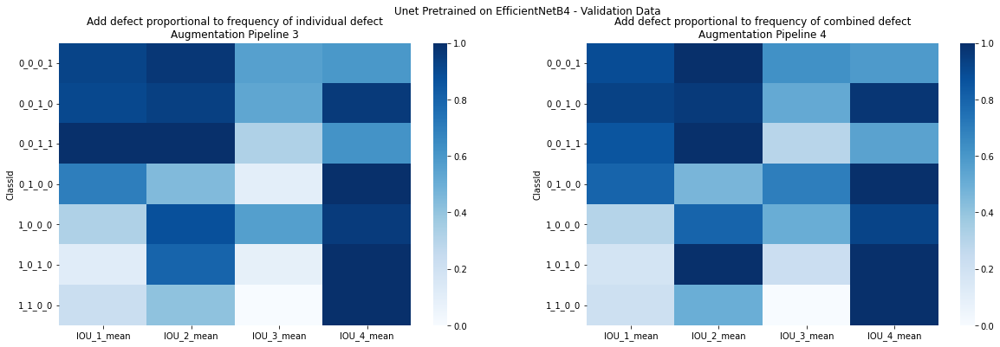

In [ ]:
temp_1 = val_image_data_model_4_4.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))

temp_2 = val_image_data_model_4_5.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))

fig, axs = plt.subplots(1,2,figsize=(20,6))
sns.heatmap(temp_1,
            vmin=0, vmax=1, cmap='Blues', ax=axs[0])

sns.heatmap(temp_2,
            vmin=0, vmax=1, cmap='Blues', ax=axs[1])

axs[0].set_yticks(np.arange(temp_1.shape[0])+0.5)
axs[0].set_yticklabels(temp_1.index.tolist(), rotation=0)
axs[1].set_yticks(np.arange(temp_2.shape[0])+0.5)
axs[1].set_yticklabels(temp_2.index.tolist(), rotation=0)

axs[0].set_title('Add defect proportional to frequency of individual defect\nAugmentation Pipeline 3')
axs[1].set_title('Add defect proportional to frequency of combined defect\nAugmentation Pipeline 4')

plt.suptitle('Unet Pretrained on EfficientNetB4 - Validation Data')
plt.show()

About Plot:
- X axis: IOU score of different defect type
- Y axis: Different combination of defects
    - For example: 1_0_1_0 implied both defect 1 and 3 are present
- Each cell implies how well model performed under differnt defect type

Observation:
- Ideally entire matrix colour should be dark blue which mean model performed great with every combination or individual defect
- In row 1 with with defect type 0_0_0_1 which implies only defect 4 is present
    - IOU 1 and IOU 2 for such samples are close to 1 since they are dark blue
    - IOU 3 is approximately 0.5 which implies model is getting confused between defect type 3 and 4
- In 1_0_1_0 we can clearly observe that augmentation pipeline 4 improved model prediction

# Final Model Training on Full Data

- Based on above observation we have selected Unet with pretrained EfficientNetB4 as backbone
- Augmentation Pipeline 4 will be used for augmentation
- Augmentation will be performed only on train data
- Here we will use all defective samples

In [ ]:
# load metadata
c_X_train, c_X_val = pickle.load(open('cropped_metadata.pkl', 'rb'))

c_X_train['ClassId'] = c_X_train.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                           str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)
c_X_val['ClassId'] = c_X_val.apply(lambda x: '_'.join([str(x['ClassId_1']),str(x['ClassId_2']),
                                                           str(x['ClassId_3']),str(x['ClassId_4'])]), axis=1)

In [ ]:
#filter data to include those with defects
train_image_data = c_X_train[(c_X_train['DiscardFromTraining']==0)&(c_X_train['isDefective']==1)]
val_image_data = c_X_val[(c_X_val['DiscardFromTraining']==0)&(c_X_val['isDefective']==1)]

In [ ]:
#defect distribution
train_image_data['ClassId'].value_counts(), val_image_data['ClassId'].value_counts()

(0_0_1_0    7971
 0_0_0_1    1113
 1_0_0_0    1041
 0_1_0_0     169
 0_0_1_1     154
 1_0_1_0      46
 1_1_0_0      32
 0_1_1_0       3
 0_1_0_1       1
 Name: ClassId, dtype: int64, 0_0_1_0    2035
 0_0_0_1     270
 1_0_0_0     268
 0_0_1_1      65
 0_1_0_0      45
 1_0_1_0      12
 1_1_0_0       6
 Name: ClassId, dtype: int64)

In [ ]:
df_v1 = c_X_train[(c_X_train['isDefective']==1) & ~(c_X_train['ClassId'].isin(['0_1_1_0', '0_1_0_1']))].copy()
df_v1['freq'] = 1./df.groupby('Stratify')['Stratify'].transform('count')

In [ ]:
root_path = '/content/drive/MyDrive/AppliedAI/self_case_study_2/SegmentationModel/Model_256_400'

In [ ]:
#prepare data for training
train_batches, STEPS_PER_EPOCH = prepare_batches(train_image_data, shuffle=True, name='train_tf_data',
                                                 augment=True, augment_pipeline=4,normalize=False,
                                                 BATCH_SIZE=8, drop_remainder=True, repeat=True)

#no augmentation for validation data
val_batches, VALIDATION_STEPS = prepare_batches(val_image_data, shuffle=True, name='val_tf_data',
                                                augment=False, augment_pipeline=4,normalize=False,
                                                BATCH_SIZE=8, drop_remainder=True, repeat=True)
STEPS_PER_EPOCH, VALIDATION_STEPS

(1316, 337)

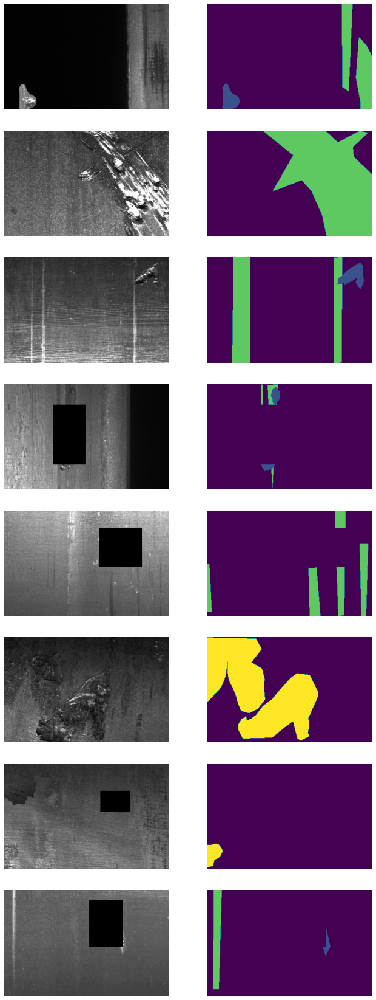

In [ ]:
#we have selected augmentation pipeline 4
#this includes vertical flip, horizontal flip, random crop and random defect addition based on frequency of defect
for images, masks in train_batches.take(1):
    display([images, masks])

## Evaluate Result after 10 epoch

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss # cce_dice_loss = dice loss + categorical loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4_full_data')

In [ ]:
unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)

history_10 = unet_model.fit(train_batches,
                         epochs=10,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history_10.history, open(os.path.join(path, 'history_10.pkl'), 'wb'))

Epoch 1/10
1316/1316 [==============================] - 1030s 769ms/step - loss: 0.5802 - iou_score: 0.3997 - val_loss: 0.6331 - val_iou_score: 0.3484 - lr: 0.0010
Epoch 2/10
1316/1316 [==============================] - 964s 733ms/step - loss: 0.4635 - iou_score: 0.4977 - val_loss: 0.6052 - val_iou_score: 0.3776 - lr: 0.0010
Epoch 3/10
1316/1316 [==============================] - 943s 717ms/step - loss: 0.4325 - iou_score: 0.5261 - val_loss: 0.5972 - val_iou_score: 0.3846 - lr: 0.0010
Epoch 4/10
1316/1316 [==============================] - 985s 749ms/step - loss: 0.4096 - iou_score: 0.5488 - val_loss: 0.5716 - val_iou_score: 0.4080 - lr: 0.0010
Epoch 5/10
1316/1316 [==============================] - 936s 711ms/step - loss: 0.3989 - iou_score: 0.5585 - val_loss: 0.6073 - val_iou_score: 0.3752 - lr: 0.0010
Epoch 6/10
1316/1316 [==============================] - 940s 715ms/step - loss: 0.3622 - iou_score: 0.5919 - val_loss: 0.5578 - val_iou_score: 0.4157 - lr: 1.0000e-04
Epoch 7/10
1316/1

In [ ]:
# prepare data for evaluate
train_batches_evaluate, _ = prepare_batches(train_image_data, shuffle=False, name='train_tf_data',
                                            augment=False, augment_pipeline=4,normalize=False,
                                            BATCH_SIZE=8, drop_remainder=False, repeat=False)

val_batches_evaluate, _ = prepare_batches(val_image_data, shuffle=False, name='val_tf_data',
                                          augment=False, augment_pipeline=4,normalize=False,
                                          BATCH_SIZE=8, drop_remainder=False, repeat=False)

In [ ]:
#load model
unet_model = create_and_load_weights(loss, optimizer, metrics, 
                                     backbone='efficientnetb4',
                                     path=path)

71696384/71686520 [==============================] - 1s 0us/step


In [ ]:
# predict
y_IOU_train = inference_segmentation_IOU(train_batches_evaluate, unet_model, weights=[[1,2,2,2,2]])
y_IOU_val = inference_segmentation_IOU(val_batches_evaluate, unet_model, weights=[[1,2,2,2,2]])

100%|██████████| 338/338 [01:56<00:00,  2.91it/s]


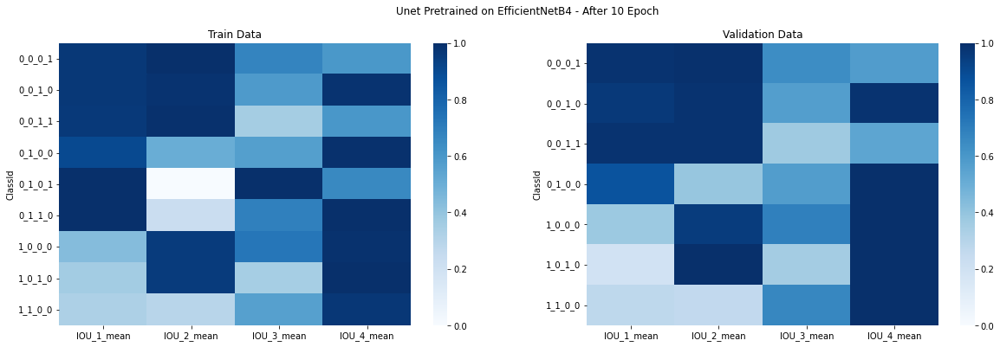

In [ ]:
col_list = ['IOU_0','IOU_1','IOU_2','IOU_3','IOU_4']
tr_res_df = pd.DataFrame(y_IOU_train, columns=col_list)
te_res_df = pd.DataFrame(y_IOU_val, columns=col_list)

tr_res_df = pd.concat([train_image_data.reset_index(drop=True), tr_res_df], axis=1)
te_res_df = pd.concat([val_image_data.reset_index(drop=True), te_res_df], axis=1)

pickle.dump([tr_res_df, te_res_df], open(os.path.join(path, 'result_after10_epoch.pkl'), 'wb'))

temp_1 = tr_res_df.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))


temp_2 = te_res_df.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))

fig, axs = plt.subplots(1,2,figsize=(20,6))
sns.heatmap(temp_1,
            vmin=0, vmax=1, cmap='Blues', ax=axs[0])

sns.heatmap(temp_2,
            vmin=0, vmax=1, cmap='Blues', ax=axs[1])

axs[0].set_yticks(np.arange(temp_1.shape[0])+0.5)
axs[0].set_yticklabels(temp_1.index.tolist(), rotation=0)
axs[1].set_yticks(np.arange(temp_2.shape[0])+0.5)
axs[1].set_yticklabels(temp_2.index.tolist(), rotation=0)

axs[0].set_title('Train Data')
axs[1].set_title('Validation Data')
plt.suptitle('Unet Pretrained on EfficientNetB4 - After 10 Epoch')
plt.show()

## Evaluate Result After 20 Epoch

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.0001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4_full_data')

unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)

unet_model.load_weights(os.path.join(path, 'model-10.h5'))

history_20 = unet_model.fit(train_batches,
                            epochs=20,
                            initial_epoch=10,
                            steps_per_epoch=STEPS_PER_EPOCH,
                            validation_data=val_batches,
                            validation_steps=VALIDATION_STEPS,
                            callbacks=callbacks)

pickle.dump(history_20.history, open(os.path.join(path, 'history_20.pkl'), 'wb'))

Epoch 11/20
   6/1316 [..............................] - ETA: 12:03 - loss: 0.2891 - iou_score: 0.6725

1316/1316 [==============================] - 1010s 754ms/step - loss: 0.3311 - iou_score: 0.6248 - val_loss: 0.5423 - val_iou_score: 0.4286 - lr: 1.0000e-04
Epoch 12/20
1316/1316 [==============================] - 1013s 770ms/step - loss: 0.3284 - iou_score: 0.6272 - val_loss: 0.5399 - val_iou_score: 0.4309 - lr: 1.0000e-04
Epoch 13/20
1316/1316 [==============================] - 970s 737ms/step - loss: 0.3230 - iou_score: 0.6324 - val_loss: 0.5382 - val_iou_score: 0.4310 - lr: 1.0000e-04
Epoch 14/20
1316/1316 [==============================] - 1009s 767ms/step - loss: 0.3207 - iou_score: 0.6351 - val_loss: 0.5381 - val_iou_score: 0.4312 - lr: 1.0000e-04
Epoch 15/20
1316/1316 [==============================] - 960s 729ms/step - loss: 0.3173 - iou_score: 0.6380 - val_loss: 0.5384 - val_iou_score: 0.4312 - lr: 1.0000e-04
Epoch 16/20
1316/1316 [==============================] - 972s 739ms/step - loss: 0.3187 - iou_score: 0.6377 - val_loss: 0.5369 - val_iou_score: 0.4335 - lr: 1.0000e-04
E

In [ ]:
# prepare data for evaluate
train_batches_evaluate, _ = prepare_batches(train_image_data, shuffle=False, name='train_tf_data',
                                            augment=False, augment_pipeline=4,normalize=False,
                                            BATCH_SIZE=8, drop_remainder=False, repeat=False)

val_batches_evaluate, _ = prepare_batches(val_image_data, shuffle=False, name='val_tf_data',
                                          augment=False, augment_pipeline=4,normalize=False,
                                          BATCH_SIZE=8, drop_remainder=False, repeat=False)

In [ ]:
#load model
unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)
unet_model.load_weights(os.path.join(path, 'model-20.h5'))

In [ ]:
# predict
y_IOU_train = inference_segmentation_IOU(train_batches_evaluate, unet_model, weights=[[1,2,2,2,2]])
y_IOU_val = inference_segmentation_IOU(val_batches_evaluate, unet_model, weights=[[1,2,2,2,2]])

100%|██████████| 338/338 [02:21<00:00,  2.38it/s]


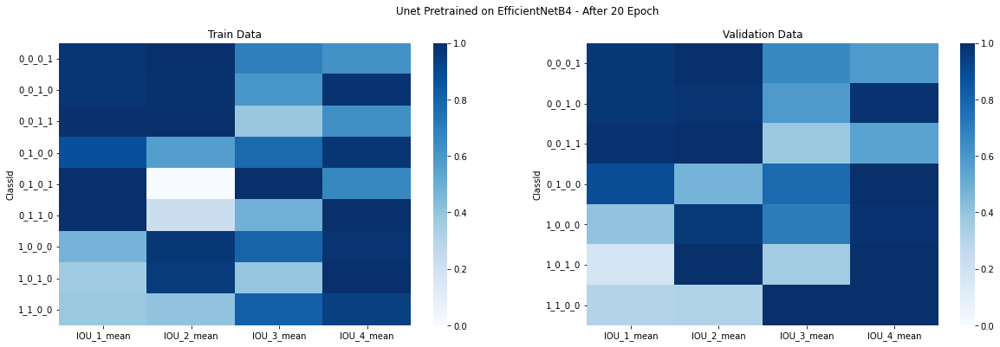

In [ ]:
col_list = ['IOU_0','IOU_1','IOU_2','IOU_3','IOU_4']
tr_res_df = pd.DataFrame(y_IOU_train, columns=col_list)
te_res_df = pd.DataFrame(y_IOU_val, columns=col_list)

tr_res_df = pd.concat([train_image_data.reset_index(drop=True), tr_res_df], axis=1)
te_res_df = pd.concat([val_image_data.reset_index(drop=True), te_res_df], axis=1)

pickle.dump([tr_res_df, te_res_df], open(os.path.join(path, 'result_after20_epoch.pkl'), 'wb'))

temp_1 = tr_res_df.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))


temp_2 = te_res_df.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))

fig, axs = plt.subplots(1,2,figsize=(20,6))
sns.heatmap(temp_1,
            vmin=0, vmax=1, cmap='Blues', ax=axs[0])

sns.heatmap(temp_2,
            vmin=0, vmax=1, cmap='Blues', ax=axs[1])

axs[0].set_yticks(np.arange(temp_1.shape[0])+0.5)
axs[0].set_yticklabels(temp_1.index.tolist(), rotation=0)
axs[1].set_yticks(np.arange(temp_2.shape[0])+0.5)
axs[1].set_yticklabels(temp_2.index.tolist(), rotation=0)

axs[0].set_title('Train Data')
axs[1].set_title('Validation Data')
plt.suptitle('Unet Pretrained on EfficientNetB4 - After 20 Epoch')
plt.show()

## Evaluate Results After 30 Epoch

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.0001)
loss = sm.losses.cce_dice_loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4_full_data')

In [ ]:
unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)
unet_model.load_weights(os.path.join(path, 'model-20.h5'))

In [ ]:
history_30 = unet_model.fit(train_batches,
                         epochs=30,
                         initial_epoch=20,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=val_batches,
                         validation_steps=VALIDATION_STEPS,
                         callbacks=callbacks)

pickle.dump(history_30.history, open(os.path.join(path, 'history_30.pkl'), 'wb'))

Epoch 21/30
1316/1316 [==============================] - 1021s 763ms/step - loss: 0.3093 - iou_score: 0.6467 - val_loss: 0.5243 - val_iou_score: 0.4431 - lr: 1.0000e-04
Epoch 22/30
1316/1316 [==============================] - 976s 742ms/step - loss: 0.3134 - iou_score: 0.6437 - val_loss: 0.5258 - val_iou_score: 0.4418 - lr: 1.0000e-04
Epoch 23/30
1316/1316 [==============================] - 935s 710ms/step - loss: 0.3094 - iou_score: 0.6470 - val_loss: 0.5264 - val_iou_score: 0.4425 - lr: 1.0000e-04
Epoch 24/30
1316/1316 [==============================] - 936s 711ms/step - loss: 0.3003 - iou_score: 0.6568 - val_loss: 0.5262 - val_iou_score: 0.4423 - lr: 1.0000e-04
Epoch 25/30
1316/1316 [==============================] - 924s 702ms/step - loss: 0.3067 - iou_score: 0.6500 - val_loss: 0.5269 - val_iou_score: 0.4412 - lr: 1.0000e-04
Epoch 26/30
1316/1316 [==============================] - 933s 709ms/step - loss: 0.2987 - iou_score: 0.6576 - val_loss: 0.5251 - val_iou_score: 0.4435 - lr: 5.

In [ ]:
# prepare data for evaluate
train_batches_evaluate, _ = prepare_batches(train_image_data, shuffle=False, name='train_tf_data',
                                            augment=False, augment_pipeline=4,normalize=False,
                                            BATCH_SIZE=8, drop_remainder=False, repeat=False)

val_batches_evaluate, _ = prepare_batches(val_image_data, shuffle=False, name='val_tf_data',
                                          augment=False, augment_pipeline=4,normalize=False,
                                          BATCH_SIZE=8, drop_remainder=False, repeat=False)

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
loss = sm.losses.cce_dice_loss # cce_dice_loss = dice loss + categorical loss
metrics = [sm.metrics.IOUScore()]
path = os.path.join(root_path, 'UnetPretrainedEfficientNetB4_with_aug_4_full_data')

In [ ]:
#load model
unet_model, callbacks = create_and_compile(loss=loss, optimizer=optimizer, metrics=metrics,
                                           backbone='efficientnetb4', path=path,
                                           freq=2)
unet_model.load_weights(os.path.join(path, 'model-30.h5'))

71696384/71686520 [==============================] - 0s 0us/step


In [ ]:
# predict
y_IOU_train = inference_segmentation_IOU(train_batches_evaluate, unet_model, weights=[[1,2,2,2,2]])
y_IOU_val = inference_segmentation_IOU(val_batches_evaluate, unet_model, weights=[[1,2,2,2,2]])

100%|██████████| 338/338 [02:21<00:00,  2.38it/s]


In [ ]:
col_list = ['IOU_0','IOU_1','IOU_2','IOU_3','IOU_4']
tr_res_df = pd.DataFrame(y_IOU_train, columns=col_list)
te_res_df = pd.DataFrame(y_IOU_val, columns=col_list)

tr_res_df = pd.concat([train_image_data.reset_index(drop=True), tr_res_df], axis=1)
te_res_df = pd.concat([val_image_data.reset_index(drop=True), te_res_df], axis=1)

pickle.dump([tr_res_df, te_res_df], open(os.path.join(path, 'result_after30_epoch.pkl'), 'wb'))
te_res_df.head()

,ImageId,isParentDefective,ImagePath,MaskPath,isDefective,ClassId_1,ClassId_2,ClassId_3,ClassId_4,ImageIdWithoutExt,DiscardFromTraining,Stratify,ClassId,IOU_0,IOU_1,IOU_2,IOU_3,IOU_4
0,cd7d5af6d_1.png,1,c_input_data/val_images/defective/cd7d5af6d_1.png,c_input_data/val_mask/cd7d5af6d_1.png,1,0,0,1,0,cd7d5af6d,0,3,0_0_1_0,0.9816,1.0,1.0,0.7672,1.0000
1,55901ac51_0.png,1,c_input_data/val_images/defective/55901ac51_0.png,c_input_data/val_mask/55901ac51_0.png,1,0,0,1,1,55901ac51,0,4,0_0_1_1,0.8917,1.0,1.0,0.1793,0.4245
2,1165781f0_0.png,1,c_input_data/val_images/defective/1165781f0_0.png,c_input_data/val_mask/1165781f0_0.png,1,0,0,1,0,1165781f0,0,3,0_0_1_0,0.9736,1.0,1.0,0.6391,1.0000
3,1897882a1_2.png,1,c_input_data/val_images/defective/1897882a1_2.png,c_input_data/val_mask/1897882a1_2.png,1,0,0,1,0,1897882a1,0,3,0_0_1_0,0.9375,1.0,1.0,0.8195,1.0000
4,a9107b3b6_2.png,1,c_input_data/val_images/defective/a9107b3b6_2.png,c_input_data/val_mask/a9107b3b6_2.png,1,0,0,1,0,a9107b3b6,0,3,0_0_1_0,0.9944,0.0,1.0,0.0000,1.0000


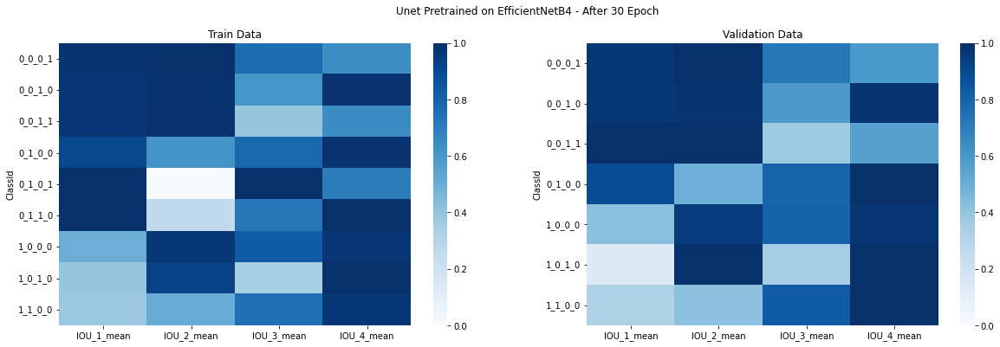

In [ ]:
temp_1 = tr_res_df.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))


temp_2 = te_res_df.groupby('ClassId').agg(IOU_1_mean=('IOU_1', 'mean'),
                                      IOU_2_mean=('IOU_2', 'mean'),
                                      IOU_3_mean=('IOU_3', 'mean'),
                                      IOU_4_mean=('IOU_4', 'mean'))

fig, axs = plt.subplots(1,2,figsize=(20,6))
sns.heatmap(temp_1,
            vmin=0, vmax=1, cmap='Blues', ax=axs[0])

sns.heatmap(temp_2,
            vmin=0, vmax=1, cmap='Blues', ax=axs[1])

axs[0].set_yticks(np.arange(temp_1.shape[0])+0.5)
axs[0].set_yticklabels(temp_1.index.tolist(), rotation=0)
axs[1].set_yticks(np.arange(temp_2.shape[0])+0.5)
axs[1].set_yticklabels(temp_2.index.tolist(), rotation=0)

axs[0].set_title('Train Data')
axs[1].set_title('Validation Data')
plt.suptitle('Unet Pretrained on EfficientNetB4 - After 30 Epoch')
plt.show()

Observation:
- There was very less improvement after 20 epochs
- Therefore it really difficult to observe any difference in plot from that after epoch 20
- In the next section we will plot some results based on IOU score

## Plot Predictions

In [ ]:
def plot_results(sample_image, sample_mask, label):
    img_patches = patchify(sample_image, (256,400,3), step=400)
    msk_patches = patchify(sample_mask, (256,400), step=400)
    msk_patches = [np.stack([msk_patches[0][j]==i for i in range(5)], axis=-1) for j in range(4)]
    msk_patches = np.array(msk_patches, dtype=np.float32)
    img_patches = np.squeeze(img_patches, (0,2))
    predicted_patches = unet_model.predict(img_patches)
    predicted_patches = np.expand_dims(predicted_patches, (0,2))
    reconstructed_patch = unpatchify(predicted_patches, (256,1600,5))
    reconstructed_patch = np.argmax(reconstructed_patch, axis=-1)

    fig, axs = plt.subplots(3,1,figsize=(11,8))
    axs[0].imshow(sample_image)
    axs[1].imshow(sample_mask, vmin=0, vmax=4, cmap='tab10')
    axs[2].imshow(reconstructed_patch, vmin=0, vmax=4, cmap='tab10')
    axs[0].set_title(f'Original Image - {label}')
    axs[1].set_title('Original Mask')
    axs[2].set_title('Predicted Mask after Blending')
    plt.show()
    return reconstructed_patch

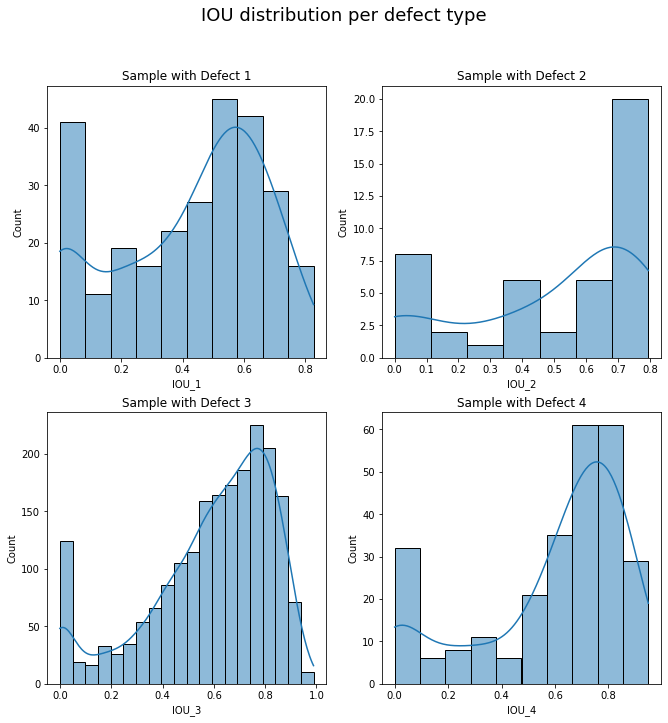

In [ ]:
fig, axs = plt.subplots(2,2,figsize=(11,11))

sns.histplot(te_res_df[te_res_df['ClassId']=='1_0_0_0']['IOU_1'], kde=True, ax=axs[0][0])
sns.histplot(te_res_df[te_res_df['ClassId']=='0_1_0_0']['IOU_2'], kde=True, ax=axs[0][1])
sns.histplot(te_res_df[te_res_df['ClassId']=='0_0_1_0']['IOU_3'], kde=True, ax=axs[1][0])
sns.histplot(te_res_df[te_res_df['ClassId']=='0_0_0_1']['IOU_4'], kde=True, ax=axs[1][1])

axs[0][0].set_title('Sample with Defect 1')
axs[0][1].set_title('Sample with Defect 2')
axs[1][0].set_title('Sample with Defect 3')
axs[1][1].set_title('Sample with Defect 4')

plt.suptitle('IOU distribution per defect type', fontsize=18)

plt.show()

In [ ]:
good_condition = ((te_res_df['ClassId']=='1_0_0_0') & (te_res_df['IOU_1'] > 0.7)) | \
                 ((te_res_df['ClassId']=='0_1_0_0') & (te_res_df['IOU_2'] > 0.7)) | \
                 ((te_res_df['ClassId']=='0_0_1_0') & (te_res_df['IOU_3'] > 0.9)) | \
                 ((te_res_df['ClassId']=='0_0_0_1') & (te_res_df['IOU_4'] > 0.8))

In [ ]:
bad_condition = ((te_res_df['ClassId']=='1_0_0_0') & (te_res_df['IOU_1'] < 0.2)) | \
                 ((te_res_df['ClassId']=='0_1_0_0') & (te_res_df['IOU_2'] < 0.2)) | \
                 ((te_res_df['ClassId']=='0_0_1_0') & (te_res_df['IOU_3'] < 0.2)) | \
                 ((te_res_df['ClassId']=='0_0_0_1') & (te_res_df['IOU_4'] < 0.2))

In [ ]:
te_res_df[good_condition].shape, te_res_df[bad_condition].shape

((168, 18), (300, 18))

In [ ]:
te_res_df[good_condition].head()

,ImageId,isParentDefective,ImagePath,MaskPath,isDefective,ClassId_1,ClassId_2,ClassId_3,ClassId_4,ImageIdWithoutExt,DiscardFromTraining,Stratify,ClassId,IOU_0,IOU_1,IOU_2,IOU_3,IOU_4
14,0ae4f8a60_2.png,1,c_input_data/val_images/defective/0ae4f8a60_2.png,c_input_data/val_mask/0ae4f8a60_2.png,1,0,0,1,0,0ae4f8a60,0,3,0_0_1_0,0.9979,1.0000,1.0,0.9308,1.0000
40,e6123fb08_2.png,1,c_input_data/val_images/defective/e6123fb08_2.png,c_input_data/val_mask/e6123fb08_2.png,1,1,0,0,0,e6123fb08,0,1,1_0_0_0,0.9965,0.7053,1.0,1.0000,1.0000
51,0030401a5_2.png,1,c_input_data/val_images/defective/0030401a5_2.png,c_input_data/val_mask/0030401a5_2.png,1,0,0,0,1,0030401a5,0,4,0_0_0_1,0.8317,1.0000,1.0,1.0000,0.8543
61,cb6fa8f89_0.png,1,c_input_data/val_images/defective/cb6fa8f89_0.png,c_input_data/val_mask/cb6fa8f89_0.png,1,0,0,1,0,cb6fa8f89,0,3,0_0_1_0,0.7149,1.0000,1.0,0.9258,1.0000
62,91b768bcb_2.png,1,c_input_data/val_images/defective/91b768bcb_2.png,c_input_data/val_mask/91b768bcb_2.png,1,0,0,1,0,91b768bcb,0,3,0_0_1_0,0.9920,1.0000,1.0,0.9054,1.0000


In [ ]:
sample_image_id_defect_1_good = te_res_df[good_condition & (te_res_df['ClassId']=='1_0_0_0')].iloc[:5]['ImageId'].values.tolist()
sample_image_id_defect_2_good = te_res_df[good_condition & (te_res_df['ClassId']=='0_1_0_0')].iloc[:5]['ImageId'].values.tolist()
sample_image_id_defect_3_good = te_res_df[good_condition & (te_res_df['ClassId']=='0_0_1_0')].iloc[:5]['ImageId'].values.tolist()
sample_image_id_defect_4_good = te_res_df[good_condition & (te_res_df['ClassId']=='0_0_0_1')].iloc[:5]['ImageId'].values.tolist()

sample_image_id_defect_1_bad = te_res_df[bad_condition & (te_res_df['ClassId']=='1_0_0_0')].iloc[:5]['ImageId'].values.tolist()
sample_image_id_defect_2_bad = te_res_df[bad_condition & (te_res_df['ClassId']=='0_1_0_0')].iloc[:5]['ImageId'].values.tolist()
sample_image_id_defect_3_bad = te_res_df[bad_condition & (te_res_df['ClassId']=='0_0_1_0')].iloc[:5]['ImageId'].values.tolist()
sample_image_id_defect_4_bad = te_res_df[bad_condition & (te_res_df['ClassId']=='0_0_0_1')].iloc[:5]['ImageId'].values.tolist()

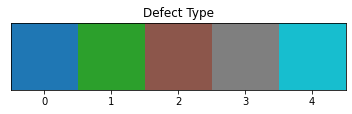

In [ ]:
plt.imshow([[0,1,2,3,4]], vmin=0, vmax=4, cmap='tab10')
plt.yticks(ticks=[], labels='')
plt.title('Defect Type')
plt.show()

### Good Examples

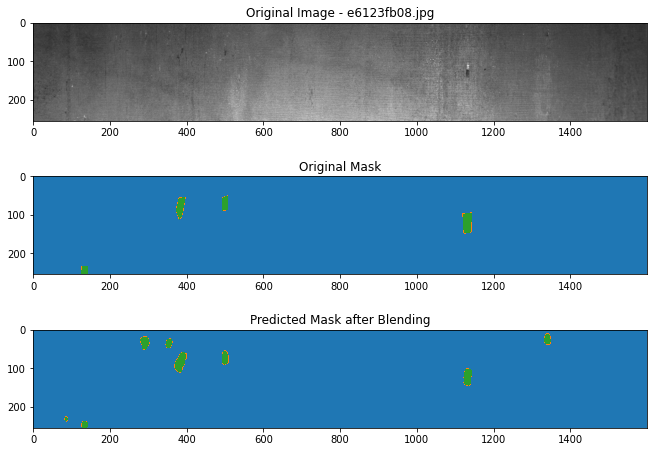

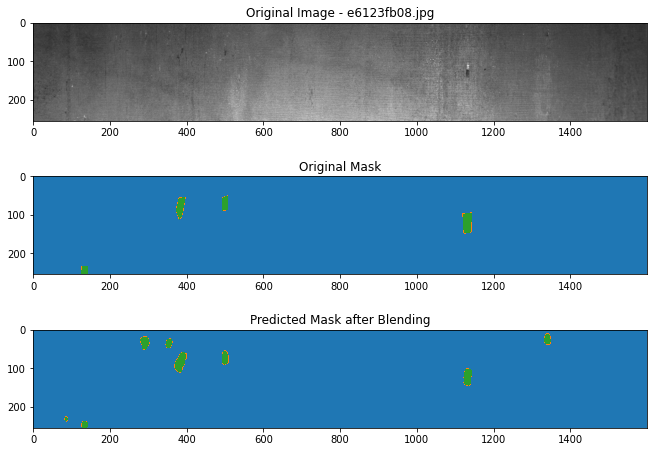

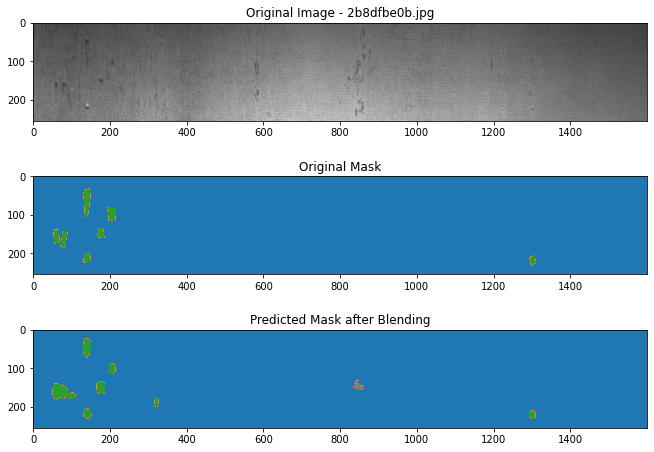

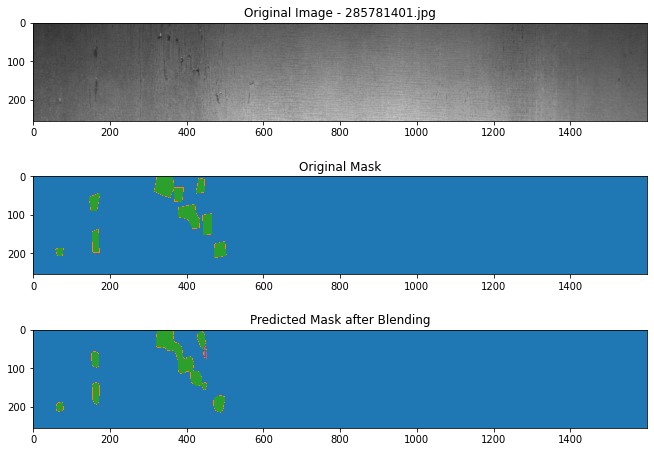

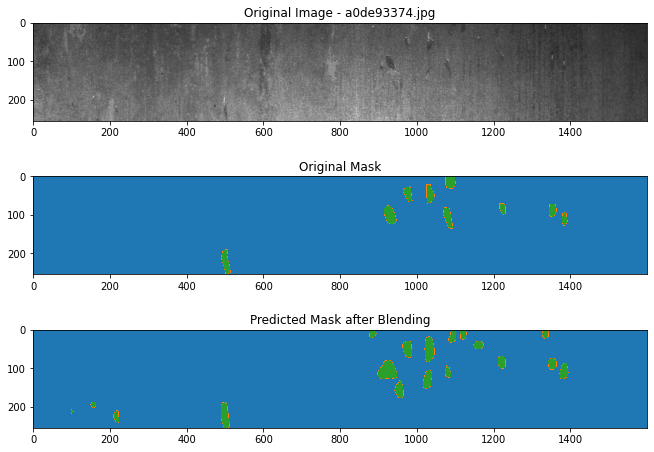

In [ ]:
#below are defect type 1 where model perform good i.e Higher IOU score > 0.7
#defect type 1 is indicated by green colour

for image_id in sample_image_id_defect_1_good:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Model have performed well where defect 1 is characterized as distinct `spot mark`
- Model has also performed well when defect 1 are characterized by `vertical marks (of small length)`

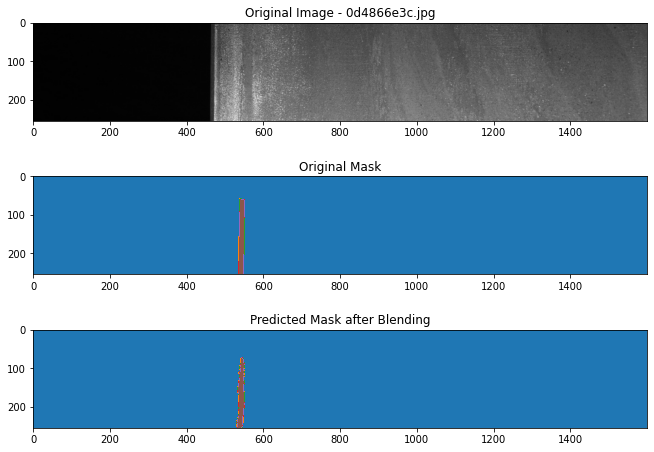

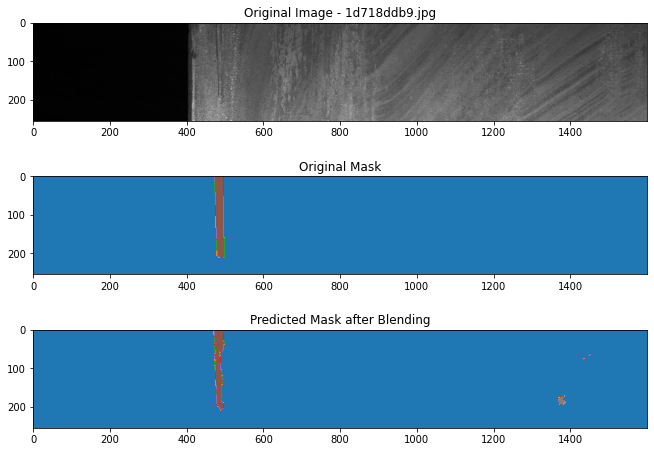

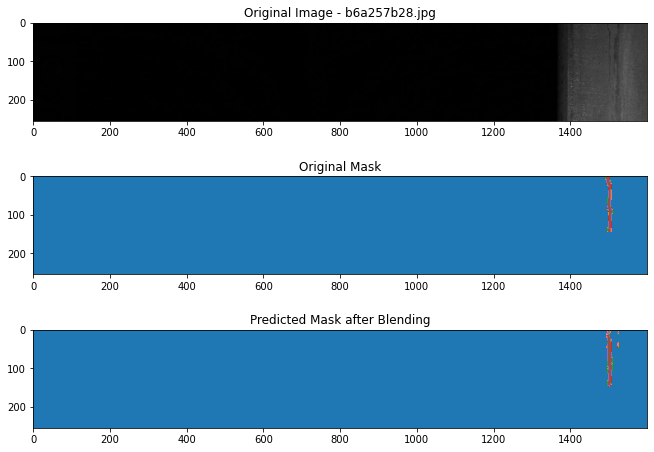

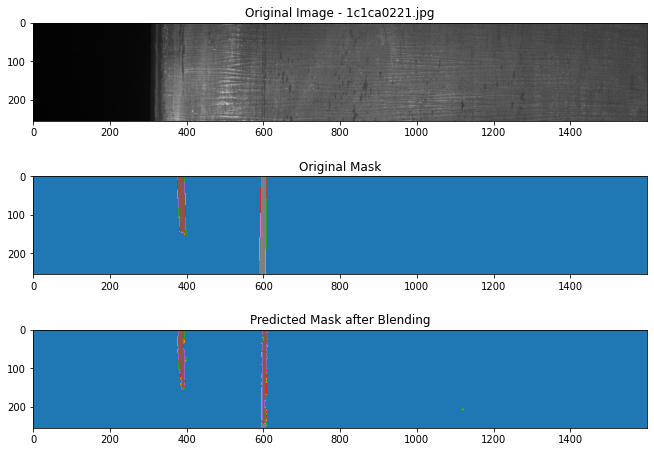

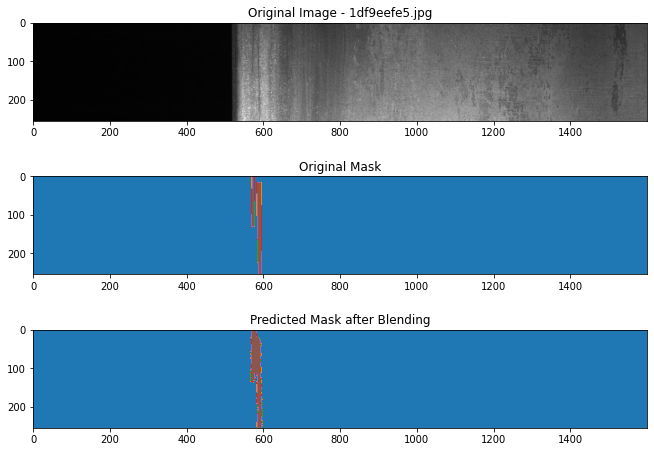

In [ ]:
#below are defect type 2 where model perform good i.e Higher IOU score > 0.7
#defect type 2 is indicated by brown colour

for image_id in sample_image_id_defect_2_good:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Model has performed well when defect type 2 are characterized as distinct `vertical marks of long length`
- In example 3 (1c1ca0221.jpg) there were two defect type (2 and 3). Both where present in the form of vertical edges. Model predicted defect type 3 as defect type 2.

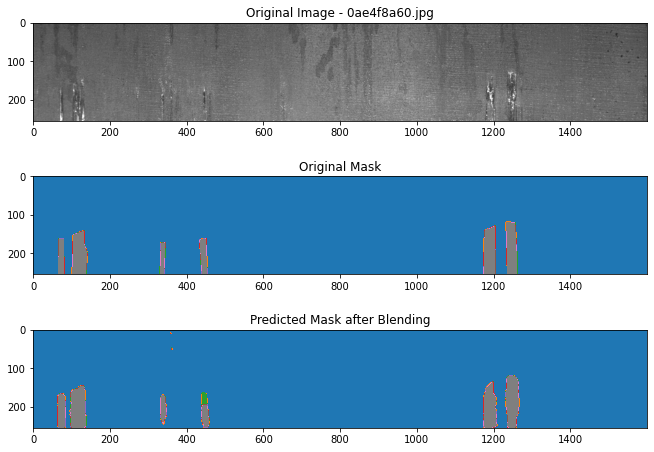

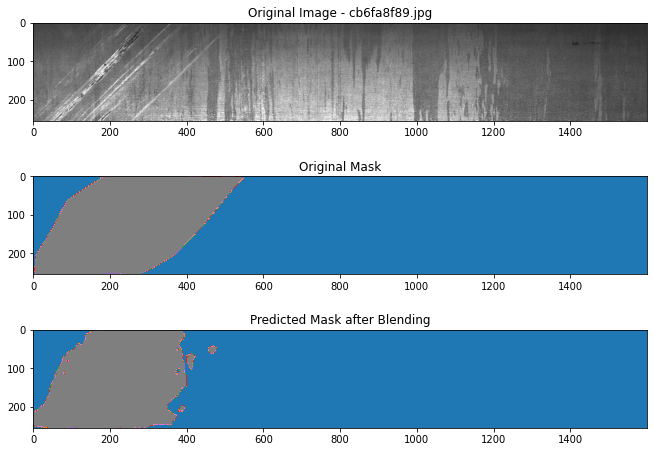

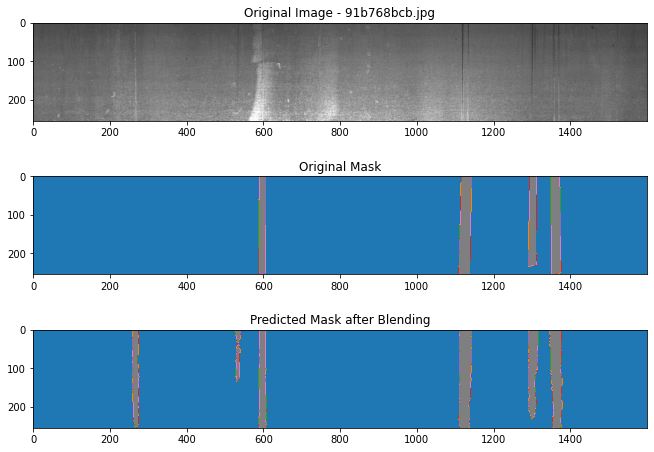

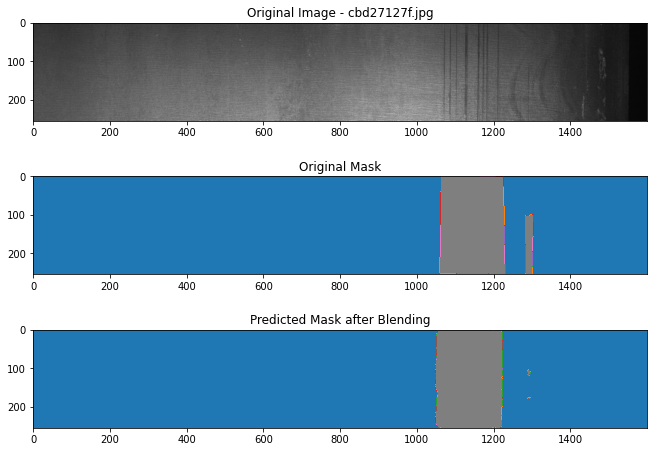

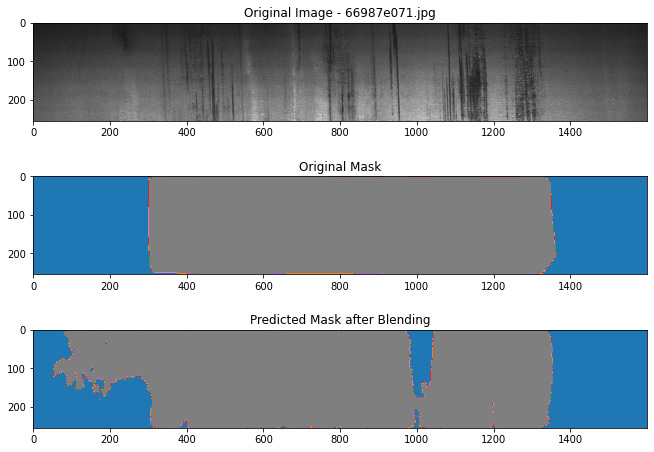

In [ ]:
#below are defect type 3 where model perform good i.e Higher IOU score > 0.7
#defect type 3 is indicated by grey colour

for image_id in sample_image_id_defect_3_good:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Model has performed well when there is distinct edge
- Also we can observe that quality of labelling in train data is poor
    - We can observe wide rectangular patch for thin defect

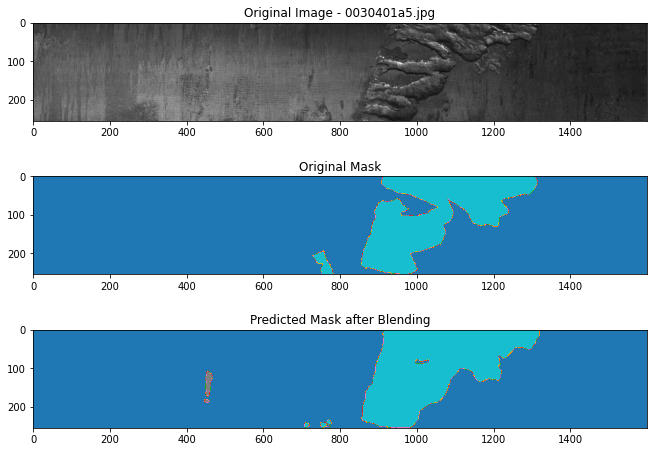

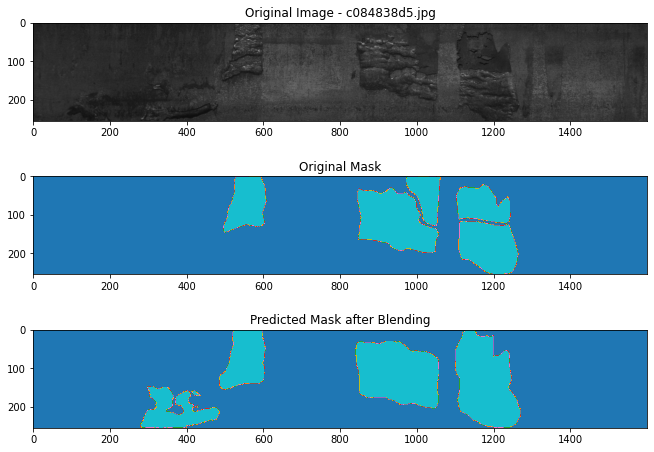

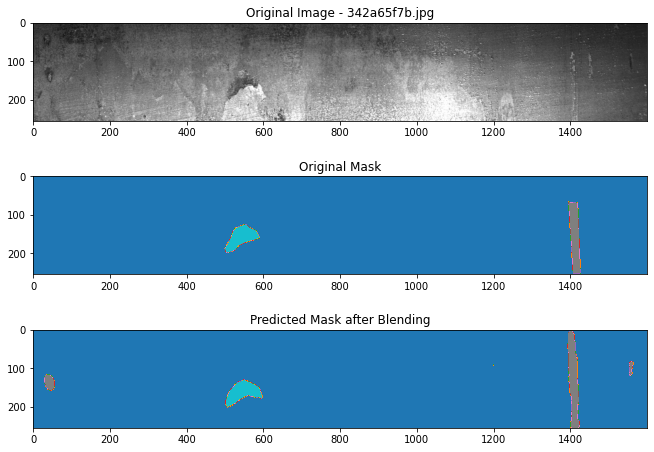

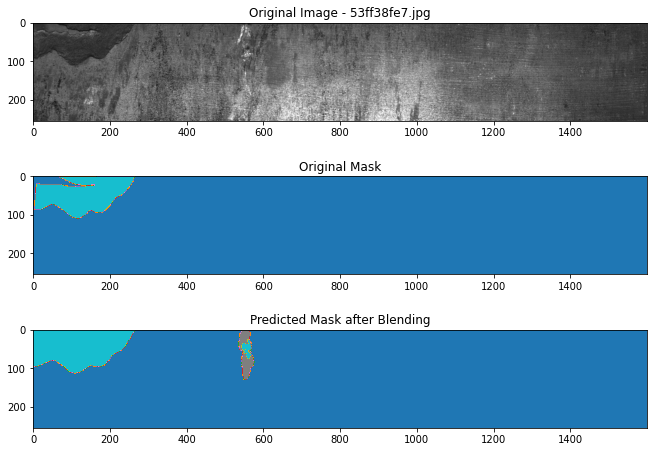

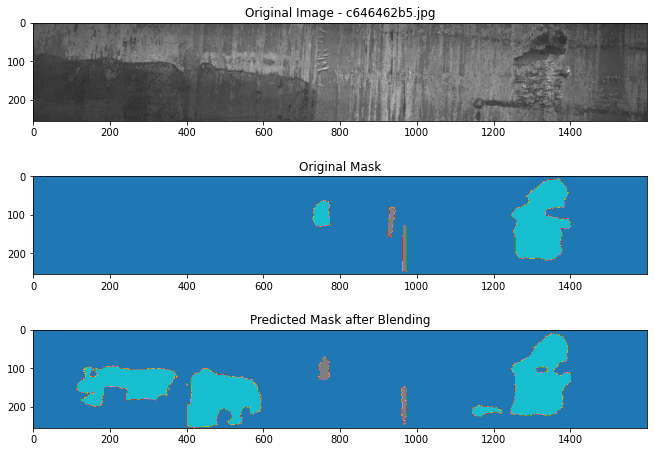

In [ ]:
#below are defect type 4 where model perform good i.e Higher IOU score > 0.7
#defect type 4 is indicated by light blue colour

for image_id in sample_image_id_defect_4_good:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Defect type 4 have distinct pattern which is very different from other defect types
- They are usually large patches

### Bad Examples

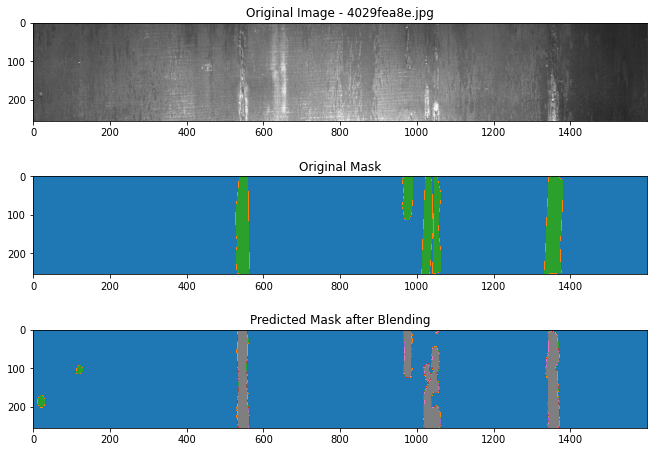

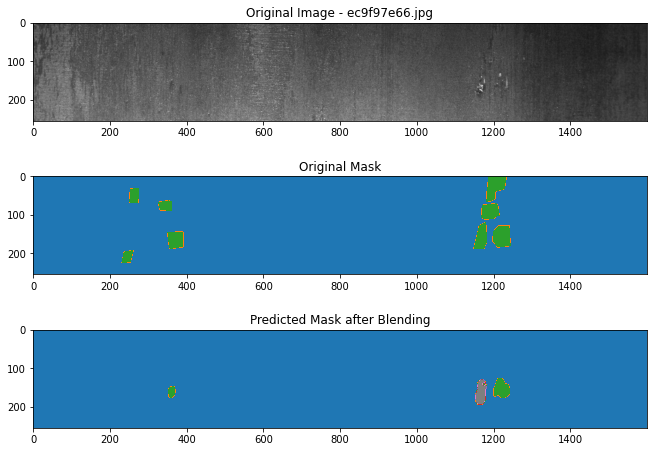

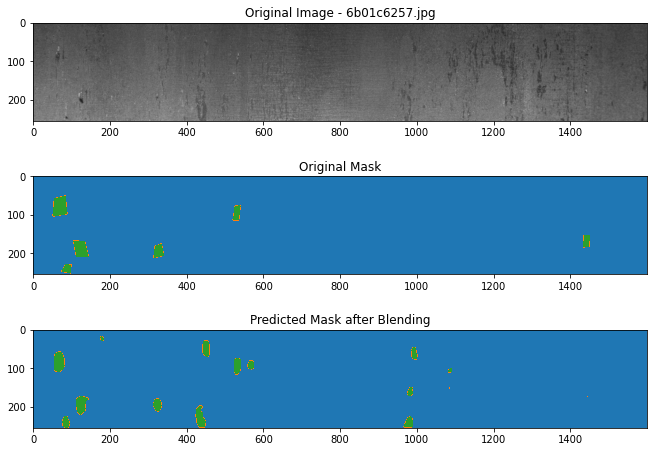

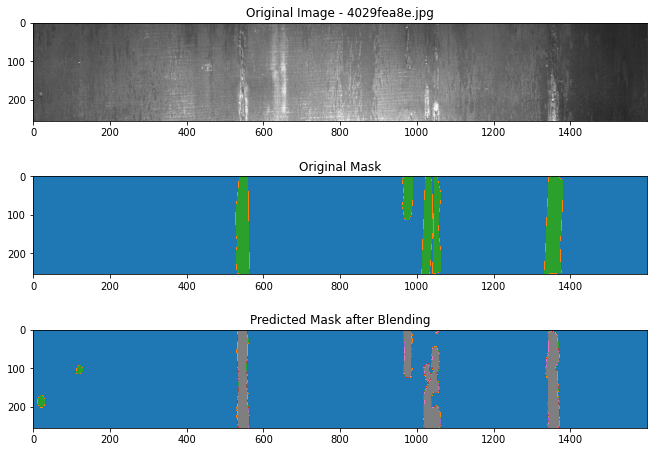

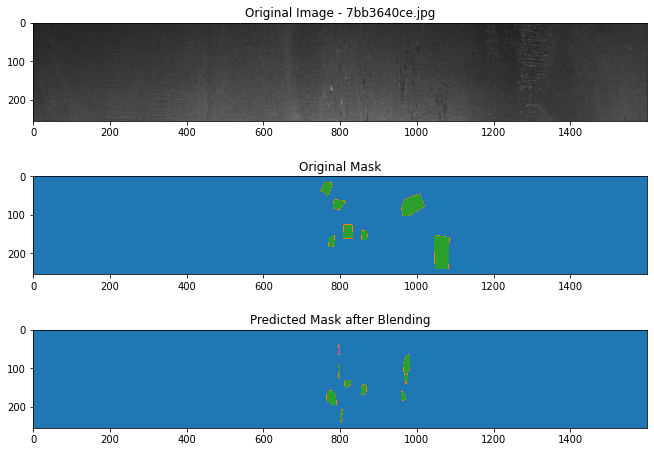

In [ ]:
#below are some bad examples w.r.t prediction of defect type 1
#defect type 1 is indicated by green colour
for image_id in sample_image_id_defect_1_bad:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Earlier we have seen that defect type 1 are characterised by distinct spot marks
- In the above example they are present as long vertical edges which is typically the characteristic of defect type 2 or 3
- Also we can observe model have predicted some spots which are not part of ground truth they appear to be defect even by us

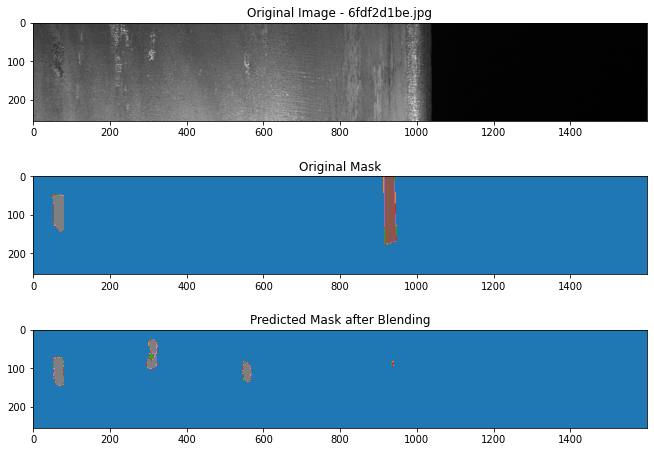

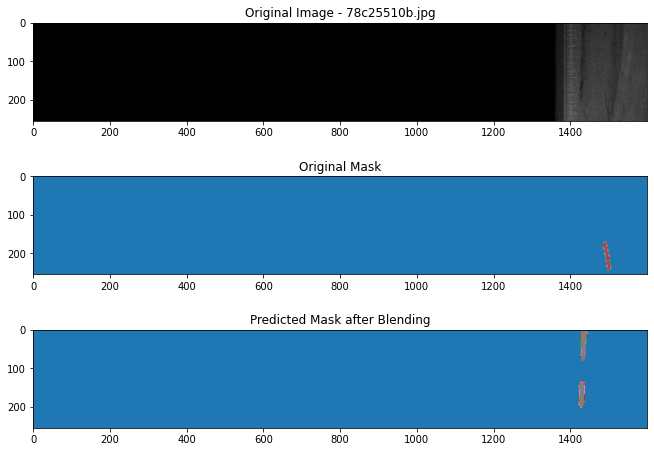

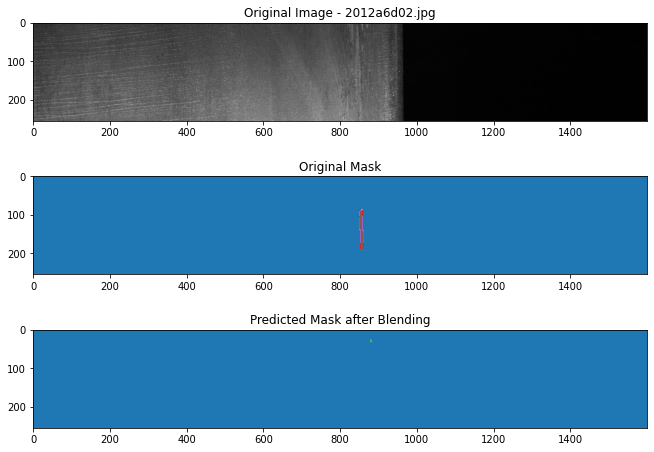

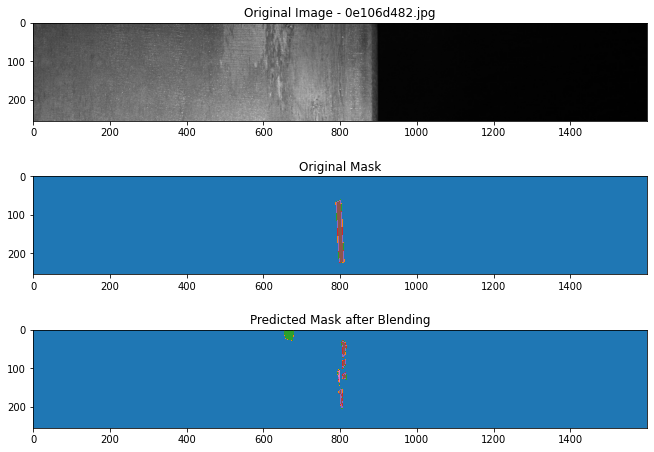

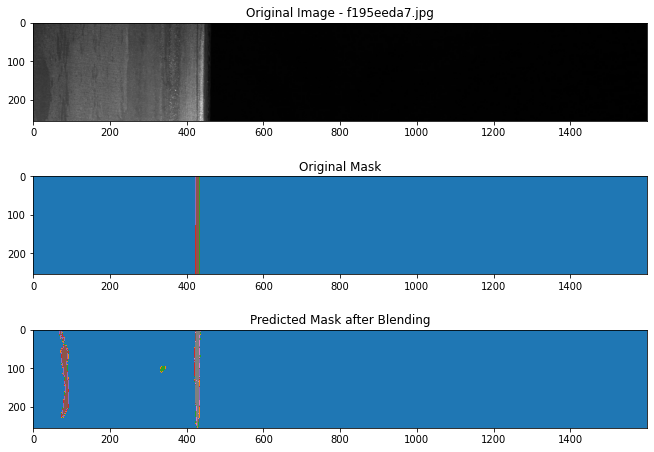

In [ ]:
#below are some bad examples w.r.t prediction of defect type 2
#defect type 2 is indicated by brown colour

for image_id in sample_image_id_defect_2_bad:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Defect type 2 and 3 both appear in the form of edge mark
- It is really difficult to distinguish them even for us
- Since the train data is dominated by defect type 3, model is predicting defect type 2 as defect type 3 

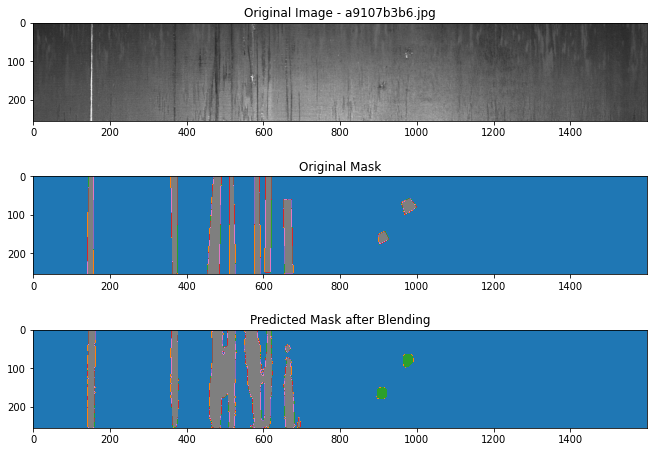

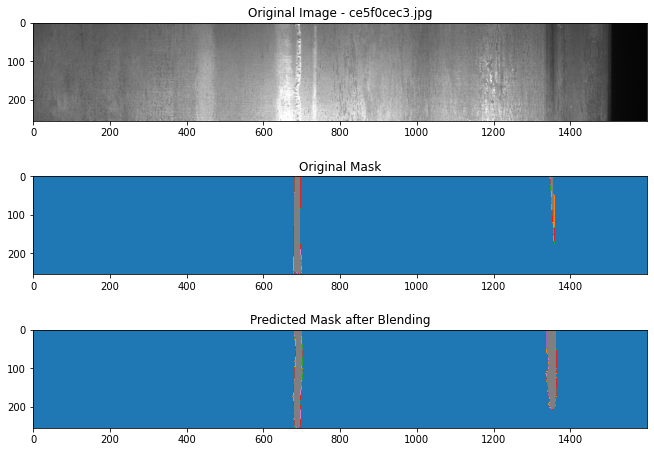

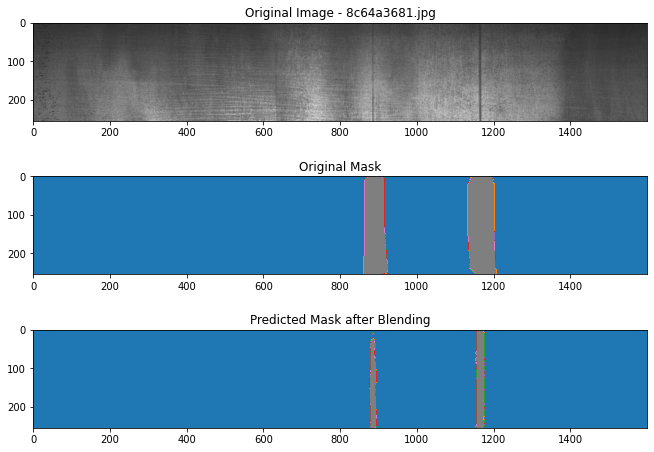

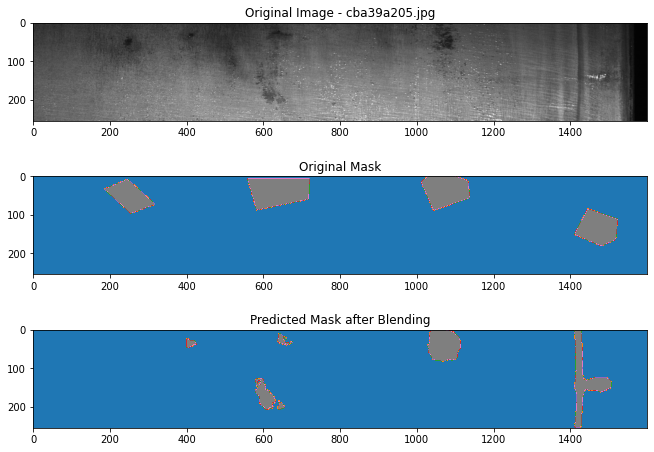

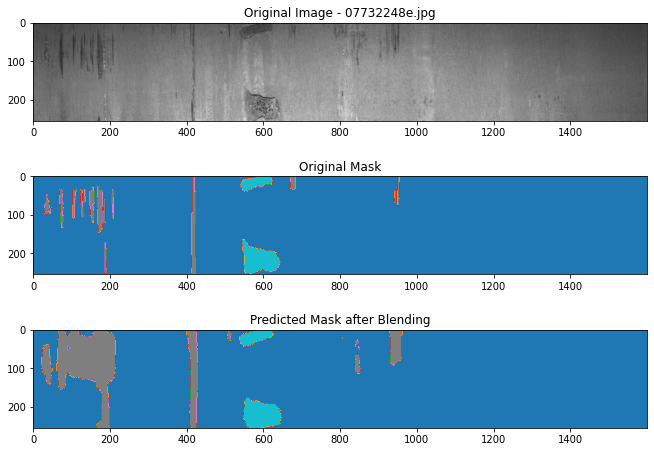

In [ ]:
#below are some bad examples w.r.t prediction of defect type 3
#defect type 3 is indicated by grey colour

for image_id in sample_image_id_defect_3_bad:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Model is predicting defect type 3 well when present in the form of edge
- However model fail to predict defect type 3 when appear as distinct spot which is the characteristic of defect type 1(green)
- Also in example 2, model did a great job in predicting the defect however ground truth is a wide patch instead of thin patch

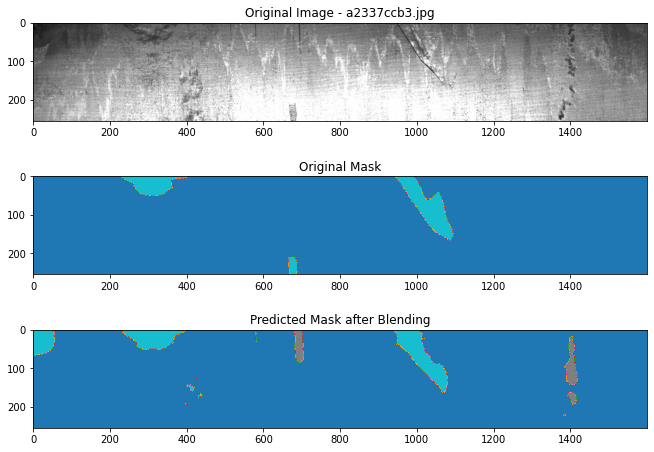

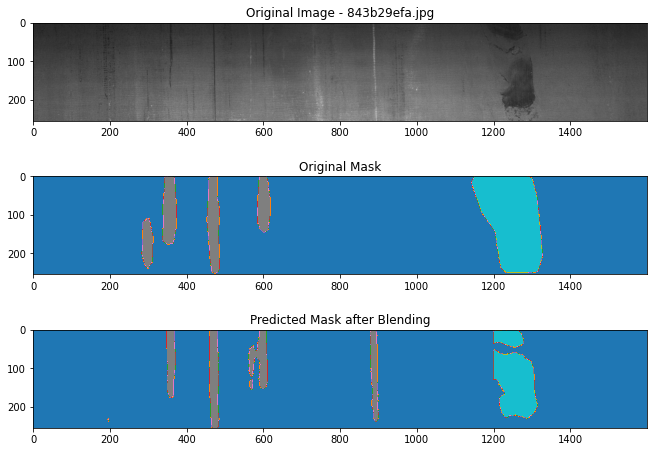

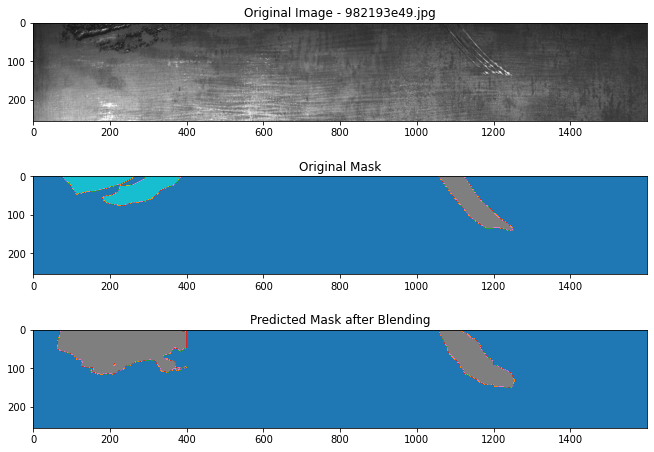

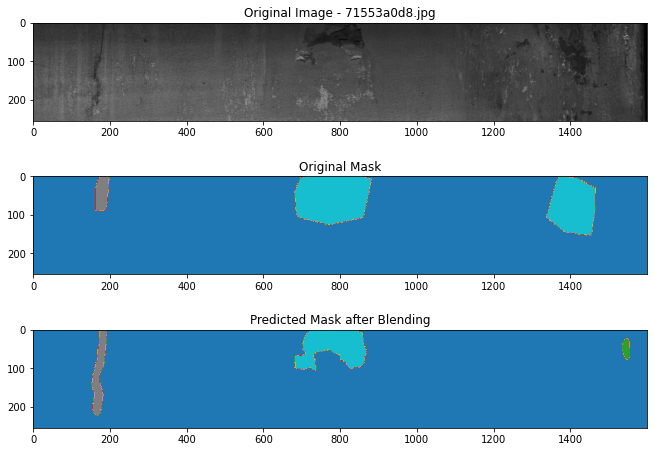

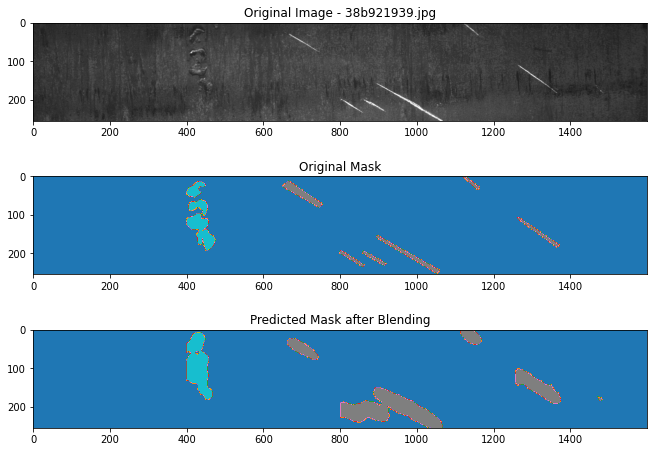

In [ ]:
#below are some bad examples w.r.t prediction of defect type 4
#defect type 4 is indicated by light blue colour

for image_id in sample_image_id_defect_4_bad:
    img_id = image_id[:-6] + '.jpg'
    msk_id = image_id[:-6] + '.png'
    sample_image_path = os.path.join('input_data/val_images/defective', img_id)
    sample_mask_path = os.path.join('input_data/val_mask', msk_id)
    sample_image = read_image(sample_image_path)
    sample_mask = read_image(sample_mask_path)
    plot_results(sample_image, sample_mask, img_id)

Observation:
- Model is trained on some specific combination of defect type
    - 0_0_1_1 (defect 3 and 4)
    - 1_0_1_0 (defect 1 and 3)
    - 1_1_0_0 (defect 1 and 2)
    - 0_1_1_0 (defect 2 and 3)
    - 0_1_0_1 (defect 2 and 4)
- There no combination of defect type 1 and 4 in train data
- Therefore in example 3 (71553a0d8.jpg), model predicted defect type 1(green) as there was distinct spot mark. However since there were no train data with defect 1 and defect 4 together it failed to predict defect type 4 in the same sample data


## Final Thoughts:
- We have observed both good and bad examples
- Distict characteristics of different defect type:
    - Defect 1: distinct spot mark, small length vertical marks
    - Defect 2: long vertical marks
    - Defect 3: scratches which are also characterized by edges (defect 2 and 3 are difficult to distinguish)
    - Defect 4: large distinct patches which are very different from other defect types

- Model perform well when:
    - Defect are distingush with their characteristic feature
        - For eg, defect type 1 appear as spot
        - Defect 2 and 3 present as edge mark

- Model perform bad when:
    - Defects are present with some different characteristics
        - For eg, defect 1 present as edge mark (model predict them as defect 2 or 3)
    - Also different combination of defect type also seem to be a problem
        - For eg, in train data we do not have defect 1 and defect 4 together in any sample
        - Therefore when model predict a sample with defect 1 it perform poorly when defect type 4 is present in the same sample as model has never seen them together in train data
- We need to collect more samples with multiple defects
- Also we can collect more data with rare defect type
